In [ ]:
from google.colab import drive
import pandas as pd

# ==========================================
# STEP 1: MOUNT DRIVE & LOAD TABULAR DATA
# ==========================================

# 1. Mount Google Drive to access your files
print("🔄 Mounting Google Drive...")
drive.mount('/content/drive', force_remount=True)

# 2. Define the exact path to your mapped CSV file
csv_path = r"/content/drive/MyDrive/Major_Project/all_features_label_2_mapped_with_x.csv"

# 3. Load the data using Pandas
print(f"\n📂 Loading tabular data from: {csv_path}")
df = pd.read_csv(csv_path)

# 4. Verify the data
print("-" * 60)
print(f"✅ Success! Loaded a dataset with {len(df)} rows and {len(df.columns)} columns.")

# Filter to ensure we only look at the rows marked with 'x' (just to be absolutely safe)
df_filtered = df[df['blood_vessel'] == 'x'].copy()
df_filtered.reset_index(drop=True, inplace=True)

print(f"[*] Verified: {len(df_filtered)} valid mapped eggs are ready for processing.")

# Display the first few rows to confirm it looks correct
display(df_filtered.head())

🔄 Mounting Google Drive...
Mounted at /content/drive

📂 Loading tabular data from: /content/drive/MyDrive/Major_Project/all_features_label_2_mapped_with_x.csv
------------------------------------------------------------
✅ Success! Loaded a dataset with 4588 rows and 45 columns.
[*] Verified: 794 valid mapped eggs are ready for processing.


,O,Lx,Ly,Lxt,Lxh,Wh50,Wh85,Wh90,Wt50,Wt85,...,L85,GPT,GYR90,Gr,R50BX,DFH,DSY,Gym,unique_id,blood_vessel
0,[546. 509.],336.786282,455.800395,251.447808,204.352636,302.823695,194.600564,164.165303,292.552214,178.538764,...,1.556130,0.746609,2.776472,0.325568,0.899157,17.487710,271.186689,0.005814,dot_1_101,x
1,[555. 510.],339.377371,460.625661,252.335095,208.290662,303.854695,191.952982,164.076902,293.832474,180.515206,...,1.582964,0.743524,2.807377,0.325203,0.895330,18.682615,271.982242,0.011628,dot_1_101,x
2,[559. 503.],348.091942,450.039998,251.017928,199.022612,301.488845,184.662073,154.879921,313.982312,188.269930,...,1.632652,0.721125,2.905735,0.347010,0.866118,54.127723,279.302952,0.007692,dot_1_110,x
3,[550. 510.],350.205654,449.160328,242.101219,207.060378,307.470153,189.999260,156.292551,312.899366,190.428923,...,1.618270,0.691312,2.873843,0.352255,0.877970,35.317676,281.776889,0.007353,dot_1_110,x
4,[557. 512.],341.071840,452.039821,244.032785,208.009615,295.991777,181.386021,151.585198,299.000000,175.146283,...,1.631833,0.715488,2.982084,0.313563,0.867828,66.900480,269.976215,0.011628,dot_1_115,x


In [ ]:
import os
import json
import glob
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold

# ==========================================
# STEP 2 & 3: ALL-IN-ONE SCAN & MASTER SPLIT
# ==========================================
print("\n🔍 Scanning Directories and Building Leak-Proof JSON Registry...")

BV_DIR = r"/content/drive/MyDrive/Major_Project/merged_blood_vessel_dataset"
OTHER_DIR = r"/content/drive/MyDrive/Major_Project/merged_dataset_rgb"
JSON_SAVE_PATH = r"/content/drive/MyDrive/Major_Project/dataset_split_registry.json"
CSV_PATH = r"/content/drive/MyDrive/Major_Project/all_features_label_2_mapped_with_x.csv"
MASTER_SPLIT_SAVE_PATH = r"/content/drive/MyDrive/Major_Project/master_kfold_splits.json"

# Load the full CSV to map IDs and Labels
df_full = pd.read_csv(CSV_PATH)
df_filtered = df_full[df_full['blood_vessel'] == 'x'].copy()

# 1. Get the list of standard IDs for the BV images
bv_valid_ids = set(df_filtered['unique_id'].astype(str))

# 2. Initialize a strict JSON structure
dataset_split = {
    "blood_vessel_images": [],
    "other_images": [],
    "leakage_images": [],
    "missing_images": []
}

def get_standard_id(filename):
    name = os.path.splitext(filename)[0]
    parts = name.split('_')
    if len(parts) >= 4 and parts[0] == 'dot':
        return f"{parts[0]}_{parts[1]}_{parts[-1]}"
    elif len(parts) >= 3 and parts[0] == 'dot':
        return f"{parts[0]}_{parts[1]}_{parts[-1]}"
    return name

# --- SCAN BLOOD VESSEL DIRECTORY ---
bv_paths = glob.glob(os.path.join(BV_DIR, "**", "*.jpg"), recursive=True)
bv_paths.extend(glob.glob(os.path.join(BV_DIR, "**", "*.png"), recursive=True))

found_bv_ids = set()
for img_path in bv_paths:
    filename = os.path.basename(img_path)
    standard_id = get_standard_id(filename)
    if standard_id in bv_valid_ids:
        dataset_split["blood_vessel_images"].append(img_path)
        found_bv_ids.add(standard_id)

# --- SCAN OTHER DIRECTORY ---
other_paths = glob.glob(os.path.join(OTHER_DIR, "**", "*.jpg"), recursive=True)
other_paths.extend(glob.glob(os.path.join(OTHER_DIR, "**", "*.png"), recursive=True))

for img_path in other_paths:
    filename = os.path.basename(img_path)
    standard_id = get_standard_id(filename)
    if standard_id in bv_valid_ids:
        dataset_split["leakage_images"].append(img_path)
    else:
        dataset_split["other_images"].append(img_path)

# --- SAVE REGISTRY ---
dataset_split["missing_images"] = list(bv_valid_ids - found_bv_ids)
with open(JSON_SAVE_PATH, 'w') as f:
    json.dump(dataset_split, f, indent=4)

print(f"✅ Registry Saved! BV Images: {len(dataset_split['blood_vessel_images'])} | Other: {len(dataset_split['other_images'])}")


# ==========================================
# STEP 3: K-FOLD MASTER SPLITTING
# ==========================================
print("\n🚀 Generating Master K-Fold Splits...")

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
master_splits = {
    "base_model_splits": {},
    "fusion_model_splits": {}
}

# ---------------------------------------------------------
# SPLIT FUSION MODEL (201 Images - mapped by unique_id)
# ---------------------------------------------------------
print("\n🔥 Splitting Fusion Model Data...")
df_unique = df_full.drop_duplicates(subset=['unique_id'])
bv_ids_found = [get_standard_id(os.path.basename(p)) for p in dataset_split['blood_vessel_images']]
df_bv = df_unique[df_unique['unique_id'].astype(str).isin(bv_ids_found)].reset_index(drop=True)

for fold_idx, (train_idx, val_idx) in enumerate(skf.split(df_bv['unique_id'], df_bv['label'])):
    master_splits["fusion_model_splits"][f"Fold_{fold_idx + 1}"] = {
        "train": df_bv.iloc[train_idx]['unique_id'].tolist(),
        "val": df_bv.iloc[val_idx]['unique_id'].tolist()
    }
print(f"[*] Successfully created 5 folds for {len(df_bv)} Blood Vessel Eggs.")


# ---------------------------------------------------------
# SPLIT BASE MODEL (4616 Images - mapped by img_path)
# ---------------------------------------------------------
print("\n🔥 Splitting Base Model Data...")

# 1. Create a fast lookup dictionary from the CSV: basename -> label
# We extract just the filename from the CSV's img_path column to ensure a perfect match
filename_to_label = {}
for _, row in df_full.dropna(subset=['img_path']).iterrows():
    csv_filename = os.path.basename(str(row['img_path']))
    filename_to_label[csv_filename] = row['label']

valid_other_paths = []
valid_other_labels = []

# 2. Check every physical image against the CSV dictionary
for p in dataset_split['other_images']:
    physical_filename = os.path.basename(p)

    if physical_filename in filename_to_label:
        valid_other_paths.append(p)
        valid_other_labels.append(filename_to_label[physical_filename])

valid_other_paths = np.array(valid_other_paths)
valid_other_labels = np.array(valid_other_labels)

print(f"[*] Validated Base Eggs: {len(valid_other_paths)}")

if len(valid_other_paths) > 0:
    for fold_idx, (train_idx, val_idx) in enumerate(skf.split(valid_other_paths, valid_other_labels)):
        master_splits["base_model_splits"][f"Fold_{fold_idx + 1}"] = {
            "train": valid_other_paths[train_idx].tolist(),
            "val": valid_other_paths[val_idx].tolist()
        }
    print(f"[*] Successfully created 5 folds for {len(valid_other_paths)} Base Model Eggs.")
else:
    print("⚠️ WARNING: 0 Base Model Eggs were validated. Please check if the filenames match exactly between your folder and the CSV's 'img_path' column.")

# ---------------------------------------------------------
# SAVE MASTER SPLIT
# ---------------------------------------------------------
with open(MASTER_SPLIT_SAVE_PATH, 'w') as f:
    json.dump(master_splits, f, indent=4)

print("-" * 60)
print(f"✅ Unified Master Splits safely exported to:\n   {MASTER_SPLIT_SAVE_PATH}")
print("🎉 Data separation and splitting is 100% complete!")


🔍 Scanning Directories and Building Leak-Proof JSON Registry...
✅ Registry Saved! BV Images: 201 | Other: 4619

🚀 Generating Master K-Fold Splits...

🔥 Splitting Fusion Model Data...
[*] Successfully created 5 folds for 201 Blood Vessel Eggs.

🔥 Splitting Base Model Data...
[*] Validated Base Eggs: 4573
[*] Successfully created 5 folds for 4573 Base Model Eggs.
------------------------------------------------------------
✅ Unified Master Splits safely exported to:
   /content/drive/MyDrive/Major_Project/master_kfold_splits.json
🎉 Data separation and splitting is 100% complete!


In [ ]:
import json

# ==========================================
# VERIFY K-FOLD SPLITS & CHECK FOR LEAKAGE
# ==========================================
SPLITS_PATH = r"/content/drive/MyDrive/Major_Project/master_kfold_splits.json"

print("🚀 Loading Master Splits for Verification...\n")

with open(SPLITS_PATH, 'r') as f:
    master_splits = json.load(f)

def verify_splits(split_dict, model_name):
    print(f"📊 VERIFYING {model_name.upper()}")
    print("-" * 60)

    total_expected = -1

    for fold_name, splits in split_dict.items():
        train_set = set(splits['train'])
        val_set = set(splits['val'])

        train_len = len(train_set)
        val_len = len(val_set)
        total = train_len + val_len

        # Check if any item exists in BOTH train and val (Intersection)
        leakage_count = len(train_set.intersection(val_set))
        leakage_status = "✅ PASS" if leakage_count == 0 else f"❌ FAIL ({leakage_count} leaked)"

        print(f"[{fold_name}] Train: {train_len:4d} | Val: {val_len:4d} | Total: {total:4d} | Status: {leakage_status}")

        if total_expected == -1:
            total_expected = total
        elif total != total_expected:
            print(f"   ⚠️ WARNING: Total items changed from {total_expected} to {total} in this fold!")

# 1. Verify the Base Model Splits
verify_splits(master_splits["base_model_splits"], "Base Model Splits (4573 Images)")
print("\n")

# 2. Verify the Fusion Model Splits
verify_splits(master_splits["fusion_model_splits"], "Fusion Model Splits (201 Images)")



🚀 Loading Master Splits for Verification...

📊 VERIFYING BASE MODEL SPLITS (4573 IMAGES)
------------------------------------------------------------
[Fold_1] Train: 3658 | Val:  915 | Total: 4573 | Status: ✅ PASS
[Fold_2] Train: 3658 | Val:  915 | Total: 4573 | Status: ✅ PASS
[Fold_3] Train: 3658 | Val:  915 | Total: 4573 | Status: ✅ PASS
[Fold_4] Train: 3659 | Val:  914 | Total: 4573 | Status: ✅ PASS
[Fold_5] Train: 3659 | Val:  914 | Total: 4573 | Status: ✅ PASS


📊 VERIFYING FUSION MODEL SPLITS (201 IMAGES)
------------------------------------------------------------
[Fold_1] Train:  160 | Val:   41 | Total:  201 | Status: ✅ PASS
[Fold_2] Train:  161 | Val:   40 | Total:  201 | Status: ✅ PASS
[Fold_3] Train:  161 | Val:   40 | Total:  201 | Status: ✅ PASS
[Fold_4] Train:  161 | Val:   40 | Total:  201 | Status: ✅ PASS
[Fold_5] Train:  161 | Val:   40 | Total:  201 | Status: ✅ PASS


### PHASE 1: BASE VGG16 TRAINING

In [ ]:
import os
import json
import copy
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
from tqdm.auto import tqdm
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import gc

# ==========================================
# 1. PATHS & HYPERPARAMETERS
# ==========================================
MASTER_SPLITS_PATH = r"/content/drive/MyDrive/Major_Project/master_kfold_splits.json"
CSV_PATH = r"/content/drive/MyDrive/Major_Project/all_features_label_2_mapped_with_x.csv"
SAVE_DIR = r"/content/drive/MyDrive/Major_Project/checkpoints_base_vgg16"
PLOT_DIR = r"/content/drive/MyDrive/Major_Project/plots_base_vgg16"

os.makedirs(SAVE_DIR, exist_ok=True)
os.makedirs(PLOT_DIR, exist_ok=True)

BATCH_SIZE = 32
NUM_EPOCHS = 40
PATIENCE = 27
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"[*] Hardware selected: {device}")

# ==========================================
# 2. LOAD CSV LABELS (M -> 1, T -> 0)
# ==========================================
print("[*] Loading exact labels from CSV...")
df_full = pd.read_csv(CSV_PATH)
filename_to_label = {}
for _, row in df_full.dropna(subset=['img_path']).iterrows():
    csv_filename = os.path.basename(str(row['img_path']))
    raw_label = str(row['label']).strip().upper()
    if raw_label == 'T':
        filename_to_label[csv_filename] = 0
    elif raw_label == 'M':
        filename_to_label[csv_filename] = 1
print(f"[*] Successfully mapped {len(filename_to_label)} files.")

# ==========================================
# 3. DATASET & TRANSFORMS
# ==========================================
class BaseEggDataset(Dataset):
    def __init__(self, image_paths, label_dict, transform=None):
        self.image_paths = image_paths
        self.label_dict = label_dict
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        filename = os.path.basename(img_path)
        label = self.label_dict.get(filename, -1)
        if label == -1:
            raise ValueError(f"CRITICAL ERROR: No label found for {filename}")
        with Image.open(img_path) as img:
            image = img.convert('RGB')
            if self.transform:
                image = self.transform(image)
        return image, torch.tensor(label, dtype=torch.long)

train_transforms = transforms.Compose([
    transforms.Resize((256, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=45),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((256, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# ==========================================
# 4. LOAD SPLITS INTO MEMORY
# ==========================================
with open(MASTER_SPLITS_PATH, 'r') as f:
    master_splits = json.load(f)
base_splits = master_splits["base_model_splits"]

# Global list to hold metrics for the final summary
if 'fold_metrics' not in globals():
    fold_metrics = []

# ==========================================
# 5. CORE TRAINING FUNCTION
# ==========================================
def train_single_fold(fold_name):
    print(f"\n{'='*20} STARTING {fold_name.upper()} {'='*20}")
    split_data = base_splits[fold_name]
    train_paths, val_paths = split_data["train"], split_data["val"]

    train_dataset = BaseEggDataset(train_paths, label_dict=filename_to_label, transform=train_transforms)
    val_dataset = BaseEggDataset(val_paths, label_dict=filename_to_label, transform=val_transforms)

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, drop_last=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

    # Class Weights
    train_labels = [filename_to_label[os.path.basename(p)] for p in train_paths]
    counts = Counter(train_labels)
    w0 = len(train_labels) / (2.0 * counts.get(0, 1))
    w1 = len(train_labels) / (2.0 * counts.get(1, 1))
    class_weights = torch.tensor([w0, w1], dtype=torch.float).to(device)

    # Model Init
    model = models.vgg16_bn(weights=models.VGG16_BN_Weights.IMAGENET1K_V1)
    for param in model.features[:24].parameters(): param.requires_grad = False
    for param in model.features[24:].parameters(): param.requires_grad = True
    model.classifier[6] = nn.Sequential(nn.Dropout(p=0.8), nn.Linear(model.classifier[6].in_features, 2))
    model = model.to(device)

    # Optimizer & Loss
    criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.2)
    optimizer = optim.AdamW([
        {'params': model.features[24:].parameters(), 'lr': 1e-5},
        {'params': model.classifier[6].parameters(), 'lr': 1e-4}
    ], weight_decay=1e-3)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)

    best_val_loss = float('inf')
    best_val_acc = 0.0
    best_model_wts = copy.deepcopy(model.state_dict())
    epochs_no_improve = 0
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

    for epoch in range(NUM_EPOCHS):
        # TRAIN
        model.train()
        train_loss, train_corrects, train_total = 0.0, 0, 0
        train_pbar = tqdm(train_loader, desc=f"Epoch {epoch+1:02d}/{NUM_EPOCHS} [Train]", leave=False)
        for inputs, labels in train_pbar:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * inputs.size(0)
            train_corrects += torch.sum(torch.max(outputs, 1)[1] == labels.data).item()
            train_total += labels.size(0)

        epoch_train_loss = train_loss / len(train_dataset)
        epoch_train_acc = train_corrects / len(train_dataset)

        # VAL
        model.eval()
        val_loss, val_corrects = 0.0, 0
        val_pbar = tqdm(val_loader, desc=f"Epoch {epoch+1:02d}/{NUM_EPOCHS} [Val]", leave=False)
        with torch.no_grad():
            for inputs, labels in val_pbar:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * inputs.size(0)
                val_corrects += torch.sum(torch.max(outputs, 1)[1] == labels.data).item()

        epoch_val_loss = val_loss / len(val_dataset)
        epoch_val_acc = val_corrects / len(val_dataset)
        scheduler.step(epoch_val_loss)

        history['train_loss'].append(epoch_train_loss)
        history['val_loss'].append(epoch_val_loss)
        history['train_acc'].append(epoch_train_acc)
        history['val_acc'].append(epoch_val_acc)

        print(f"Epoch [{epoch+1:02d}/{NUM_EPOCHS}] | Train Loss: {epoch_train_loss:.4f} Acc: {epoch_train_acc:.4f} | Val Loss: {epoch_val_loss:.4f} Acc: {epoch_val_acc:.4f}")

        if epoch_val_loss < best_val_loss:
            best_val_loss, best_val_acc = epoch_val_loss, epoch_val_acc
            best_model_wts = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0
            print(f"   🌟 Val Loss improved to {epoch_val_loss:.4f}. Model saved.")
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= PATIENCE:
                print(f"🛑 Early stopping triggered!")
                break

    # Save Checkpoint
    model.load_state_dict(best_model_wts)
    torch.save(model.state_dict(), os.path.join(SAVE_DIR, f"vgg16_base_{fold_name}.pth"))

    # Store Metrics Globally
    global fold_metrics
    # Update if fold already exists (in case user re-runs a cell)
    fold_metrics = [m for m in fold_metrics if m['fold'] != fold_name]
    fold_metrics.append({'fold': fold_name, 'loss': best_val_loss, 'acc': best_val_acc})

    # Plot Curves
    epochs_range = range(1, len(history['train_loss']) + 1)
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, history['train_loss'], label='Train Loss', marker='o')
    plt.plot(epochs_range, history['val_loss'], label='Val Loss', marker='x')
    plt.title(f'{fold_name.upper()} - Loss')
    plt.legend(); plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, history['train_acc'], label='Train Acc', marker='o')
    plt.plot(epochs_range, history['val_acc'], label='Val Acc', marker='x')
    plt.title(f'{fold_name.upper()} - Accuracy')
    plt.legend(); plt.grid(True)

    plt.tight_layout()
    plt.savefig(os.path.join(PLOT_DIR, f"{fold_name}_curves.png"), dpi=300)
    plt.show()

    # Memory Cleanup
    del model, optimizer, train_loader, val_loader, train_dataset, val_dataset
    torch.cuda.empty_cache()
    gc.collect()
    print(f"✅ {fold_name.upper()} COMPLETE!")

print("✅ Setup complete! You can now run the Fold execution cells sequentially.")

[*] Hardware selected: cpu
[*] Loading exact labels from CSV...
[*] Successfully mapped 4588 files.
✅ Setup complete! You can now run the Fold execution cells sequentially.


In [ ]:
# Execute Fold 1
# train_single_fold("Fold_1")

In [ ]:
# Execute Fold 2
# train_single_fold("Fold_2")

In [ ]:
# Execute Fold 3
# train_single_fold("Fold_3")

In [ ]:
import os
import json
import copy
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
from tqdm.auto import tqdm
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import gc

# ==========================================
# 1. PATHS & HYPERPARAMETERS
# ==========================================
MASTER_SPLITS_PATH = r"/content/drive/MyDrive/Major_Project/master_kfold_splits.json"
CSV_PATH = r"/content/drive/MyDrive/Major_Project/all_features_label_2_mapped_with_x.csv"

# Updated paths for EfficientNet
SAVE_DIR = r"/content/drive/MyDrive/Major_Project/checkpoints_base_effnet"
PLOT_DIR = r"/content/drive/MyDrive/Major_Project/plots_base_effnet"

os.makedirs(SAVE_DIR, exist_ok=True)
os.makedirs(PLOT_DIR, exist_ok=True)

BATCH_SIZE = 32
NUM_EPOCHS = 40
PATIENCE = 8
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"[*] Hardware selected: {device}")

# ==========================================
# 2. LOAD CSV LABELS (M -> 1, T -> 0)
# ==========================================
print("[*] Loading exact labels from CSV...")
df_full = pd.read_csv(CSV_PATH)
filename_to_label = {}
for _, row in df_full.dropna(subset=['img_path']).iterrows():
    csv_filename = os.path.basename(str(row['img_path']))
    raw_label = str(row['label']).strip().upper()
    if raw_label == 'T':
        filename_to_label[csv_filename] = 0
    elif raw_label == 'M':
        filename_to_label[csv_filename] = 1
print(f"[*] Successfully mapped {len(filename_to_label)} files.")

# ==========================================
# 3. DATASET & TRANSFORMS
# ==========================================
class BaseEggDataset(Dataset):
    def __init__(self, image_paths, label_dict, transform=None):
        self.image_paths = image_paths
        self.label_dict = label_dict
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        filename = os.path.basename(img_path)
        label = self.label_dict.get(filename, -1)
        if label == -1:
            raise ValueError(f"CRITICAL ERROR: No label found for {filename}")
        with Image.open(img_path) as img:
            image = img.convert('RGB')
            if self.transform:
                image = self.transform(image)
        return image, torch.tensor(label, dtype=torch.long)

train_transforms = transforms.Compose([
    transforms.Resize((256, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=45),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)), # <-- ADD THIS
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((256, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# ==========================================
# 4. LOAD SPLITS INTO MEMORY
# ==========================================
with open(MASTER_SPLITS_PATH, 'r') as f:
    master_splits = json.load(f)
base_splits = master_splits["base_model_splits"]

# Global list to hold metrics for the final summary
if 'fold_metrics' not in globals():
    fold_metrics = []

# ==========================================
# 5. CORE TRAINING FUNCTION (EFFICIENTNET)
# ==========================================
def train_single_fold_efficient(fold_name):
    print(f"\n{'='*20} STARTING {fold_name.upper()} {'='*20}")
    split_data = base_splits[fold_name]
    train_paths, val_paths = split_data["train"], split_data["val"]

    train_dataset = BaseEggDataset(train_paths, label_dict=filename_to_label, transform=train_transforms)
    val_dataset = BaseEggDataset(val_paths, label_dict=filename_to_label, transform=val_transforms)

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, drop_last=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

    # Class Weights
    train_labels = [filename_to_label[os.path.basename(p)] for p in train_paths]
    counts = Counter(train_labels)
    w0 = len(train_labels) / (2.0 * counts.get(0, 1))
    w1 = len(train_labels) / (2.0 * counts.get(1, 1))
    class_weights = torch.tensor([w0, w1], dtype=torch.float).to(device)

    # Model Init - EfficientNet-B0
    model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)

    # EfficientNet features have 9 blocks (0 to 8).
    # Freeze blocks 0 to 5, unfreeze 6 to 8 for fine-tuning.
    for param in model.features[:8].parameters():
        param.requires_grad = False
    for param in model.features[8:].parameters():
        param.requires_grad = True

    # Rebuild Classifier Head
    num_features = model.classifier[1].in_features
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.7, inplace=True),
        nn.Linear(num_features, 2)
    )
    model = model.to(device)

    # Optimizer & Loss
    criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.2)
    optimizer = optim.AdamW([
        {'params': model.features[8:].parameters(), 'lr': 1e-4},
        {'params': model.classifier.parameters(), 'lr': 1e-3}
    ], weight_decay=1e-2)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)

    best_val_loss = float('inf')
    best_val_acc = 0.0
    best_model_wts = copy.deepcopy(model.state_dict())
    epochs_no_improve = 0
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

    for epoch in range(NUM_EPOCHS):
        # TRAIN
        model.train()
        train_loss, train_corrects, train_total = 0.0, 0, 0
        train_pbar = tqdm(train_loader, desc=f"Epoch {epoch+1:02d}/{NUM_EPOCHS} [Train]", leave=False)
        for inputs, labels in train_pbar:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * inputs.size(0)
            train_corrects += torch.sum(torch.max(outputs, 1)[1] == labels.data).item()
            train_total += labels.size(0)

        epoch_train_loss = train_loss / len(train_dataset)
        epoch_train_acc = train_corrects / len(train_dataset)

        # VAL
        model.eval()
        val_loss, val_corrects = 0.0, 0
        val_pbar = tqdm(val_loader, desc=f"Epoch {epoch+1:02d}/{NUM_EPOCHS} [Val]", leave=False)
        with torch.no_grad():
            for inputs, labels in val_pbar:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * inputs.size(0)
                val_corrects += torch.sum(torch.max(outputs, 1)[1] == labels.data).item()

        epoch_val_loss = val_loss / len(val_dataset)
        epoch_val_acc = val_corrects / len(val_dataset)
        scheduler.step(epoch_val_loss)

        history['train_loss'].append(epoch_train_loss)
        history['val_loss'].append(epoch_val_loss)
        history['train_acc'].append(epoch_train_acc)
        history['val_acc'].append(epoch_val_acc)

        print(f"Epoch [{epoch+1:02d}/{NUM_EPOCHS}] | Train Loss: {epoch_train_loss:.4f} Acc: {epoch_train_acc:.4f} | Val Loss: {epoch_val_loss:.4f} Acc: {epoch_val_acc:.4f}")

        if epoch_val_loss < best_val_loss:
            best_val_loss, best_val_acc = epoch_val_loss, epoch_val_acc
            best_model_wts = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0
            print(f"   🌟 Val Loss improved to {epoch_val_loss:.4f}. Model saved.")
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= PATIENCE:
                print(f"🛑 Early stopping triggered!")
                break

    # Save Checkpoint
    model.load_state_dict(best_model_wts)
    torch.save(model.state_dict(), os.path.join(SAVE_DIR, f"effnet_base_{fold_name}.pth"))

    # Store Metrics Globally
    global fold_metrics
    # Update if fold already exists (in case user re-runs a cell)
    fold_metrics = [m for m in fold_metrics if m['fold'] != fold_name]
    fold_metrics.append({'fold': fold_name, 'loss': best_val_loss, 'acc': best_val_acc})

    # Plot Curves
    epochs_range = range(1, len(history['train_loss']) + 1)
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, history['train_loss'], label='Train Loss', marker='o')
    plt.plot(epochs_range, history['val_loss'], label='Val Loss', marker='x')
    plt.title(f'{fold_name.upper()} - Loss')
    plt.legend(); plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, history['train_acc'], label='Train Acc', marker='o')
    plt.plot(epochs_range, history['val_acc'], label='Val Acc', marker='x')
    plt.title(f'{fold_name.upper()} - Accuracy')
    plt.legend(); plt.grid(True)

    plt.tight_layout()
    plt.savefig(os.path.join(PLOT_DIR, f"{fold_name}_curves.png"), dpi=300)
    plt.show()

    # Memory Cleanup
    del model, optimizer, train_loader, val_loader, train_dataset, val_dataset
    torch.cuda.empty_cache()
    gc.collect()
    print(f"✅ {fold_name.upper()} COMPLETE!")

print("✅ Setup complete! You can now run the Fold execution cells sequentially.")

[*] Hardware selected: cpu
[*] Loading exact labels from CSV...
[*] Successfully mapped 4588 files.
✅ Setup complete! You can now run the Fold execution cells sequentially.


In [ ]:
# Execute Fold 3 - Eff
train_single_fold_efficient("Fold_3")


==================== STARTING FOLD_3 ====================


Epoch 01/40 [Train]:   0%|          | 0/457 [00:00<?, ?it/s]

Epoch 01/40 [Val]:   0%|          | 0/115 [00:00<?, ?it/s]

Epoch [01/40] | Train Loss: 0.7486 Acc: 0.4902 | Val Loss: 0.7279 Acc: 0.4328
   🌟 Val Loss improved to 0.7279. Model saved.


Epoch 02/40 [Train]:   0%|          | 0/457 [00:00<?, ?it/s]

Epoch 02/40 [Val]:   0%|          | 0/115 [00:00<?, ?it/s]

Epoch [02/40] | Train Loss: 0.7554 Acc: 0.4945 | Val Loss: 0.7230 Acc: 0.5202
   🌟 Val Loss improved to 0.7230. Model saved.


Epoch 03/40 [Train]:   0%|          | 0/457 [00:00<?, ?it/s]

Epoch 03/40 [Val]:   0%|          | 0/115 [00:00<?, ?it/s]

Epoch [03/40] | Train Loss: 0.7486 Acc: 0.5169 | Val Loss: 0.7299 Acc: 0.4874


Epoch 04/40 [Train]:   0%|          | 0/457 [00:00<?, ?it/s]

Epoch 04/40 [Val]:   0%|          | 0/115 [00:00<?, ?it/s]

Epoch [04/40] | Train Loss: 0.7597 Acc: 0.4989 | Val Loss: 0.7331 Acc: 0.5858


Epoch 05/40 [Train]:   0%|          | 0/457 [00:00<?, ?it/s]

Epoch 05/40 [Val]:   0%|          | 0/115 [00:00<?, ?it/s]

Epoch [05/40] | Train Loss: 0.7476 Acc: 0.5055 | Val Loss: 0.7262 Acc: 0.4568


Epoch 06/40 [Train]:   0%|          | 0/457 [00:00<?, ?it/s]

Epoch 06/40 [Val]:   0%|          | 0/115 [00:00<?, ?it/s]

Epoch [06/40] | Train Loss: 0.7561 Acc: 0.4954 | Val Loss: 0.7196 Acc: 0.4721
   🌟 Val Loss improved to 0.7196. Model saved.


Epoch 07/40 [Train]:   0%|          | 0/457 [00:00<?, ?it/s]

Epoch 07/40 [Val]:   0%|          | 0/115 [00:00<?, ?it/s]

Epoch [07/40] | Train Loss: 0.7538 Acc: 0.4984 | Val Loss: 0.7303 Acc: 0.4667


Epoch 08/40 [Train]:   0%|          | 0/457 [00:00<?, ?it/s]

Epoch 08/40 [Val]:   0%|          | 0/115 [00:00<?, ?it/s]

Epoch [08/40] | Train Loss: 0.7567 Acc: 0.4975 | Val Loss: 0.7151 Acc: 0.5093
   🌟 Val Loss improved to 0.7151. Model saved.


Epoch 09/40 [Train]:   0%|          | 0/457 [00:00<?, ?it/s]

Epoch 09/40 [Val]:   0%|          | 0/115 [00:00<?, ?it/s]

Epoch [09/40] | Train Loss: 0.7603 Acc: 0.4973 | Val Loss: 0.7155 Acc: 0.4765


Epoch 10/40 [Train]:   0%|          | 0/457 [00:00<?, ?it/s]

Epoch 10/40 [Val]:   0%|          | 0/115 [00:00<?, ?it/s]

Epoch [10/40] | Train Loss: 0.7539 Acc: 0.4995 | Val Loss: 0.7092 Acc: 0.5093
   🌟 Val Loss improved to 0.7092. Model saved.


Epoch 11/40 [Train]:   0%|          | 0/457 [00:00<?, ?it/s]

Epoch 11/40 [Val]:   0%|          | 0/115 [00:00<?, ?it/s]

Epoch [11/40] | Train Loss: 0.7519 Acc: 0.5077 | Val Loss: 0.7223 Acc: 0.5530


Epoch 12/40 [Train]:   0%|          | 0/457 [00:00<?, ?it/s]

Epoch 12/40 [Val]:   0%|          | 0/115 [00:00<?, ?it/s]

Epoch [12/40] | Train Loss: 0.7597 Acc: 0.4885 | Val Loss: 0.7136 Acc: 0.5071


Epoch 13/40 [Train]:   0%|          | 0/457 [00:00<?, ?it/s]

In [ ]:
# Execute Fold 4 - Eff
# train_single_fold_efficient("Fold_4")

In [ ]:
# Execute Fold 5 - Eff
# train_single_fold_efficient("Fold_5")

In [ ]:
import os
import json
import copy
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
from tqdm.auto import tqdm
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import gc

# ==========================================
# 1. PATHS & HYPERPARAMETERS
# ==========================================
MASTER_SPLITS_PATH = r"/content/drive/MyDrive/Major_Project/master_kfold_splits.json"
REGISTRY_PATH = r"/content/drive/MyDrive/Major_Project/dataset_split_registry.json"
CSV_PATH = r"/content/drive/MyDrive/Major_Project/all_features_label_2_mapped_with_x.csv"

# Dedicated folders for the Global Mix experiment
SAVE_DIR = r"/content/drive/MyDrive/Major_Project/checkpoints_global_effnet"
PLOT_DIR = r"/content/drive/MyDrive/Major_Project/plots_global_effnet"

os.makedirs(SAVE_DIR, exist_ok=True)
os.makedirs(PLOT_DIR, exist_ok=True)

BATCH_SIZE = 8
NUM_EPOCHS = 40
PATIENCE = 15  # 🚨 Strict Early Stopping to prevent overfitting
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# ==========================================
# 2. LOAD LABELS AND ID MAPPING
# ==========================================
df_full = pd.read_csv(CSV_PATH)
filename_to_label = {}
id_to_label = {}

# A. Map Base Eggs from CSV
for _, row in df_full.dropna(subset=['img_path']).iterrows():
    csv_filename = os.path.basename(str(row['img_path']))
    raw_label = str(row['label']).strip().upper()
    std_id = str(row['unique_id'])

    label_int = 0 if raw_label == 'T' else 1 if raw_label == 'M' else -1
    if label_int != -1:
        filename_to_label[csv_filename] = label_int
        id_to_label[std_id] = label_int

# B. Map Blood Vessel Eggs directly from their filenames
with open(REGISTRY_PATH, 'r') as f:
    registry = json.load(f)

def get_standard_id(filename):
    name = os.path.splitext(filename)[0]
    parts = name.split('_')
    if len(parts) >= 4 and parts[0] == 'dot': return f"{parts[0]}_{parts[1]}_{parts[-1]}"
    elif len(parts) >= 3 and parts[0] == 'dot': return f"{parts[0]}_{parts[1]}_{parts[-1]}"
    return name

for p in registry['blood_vessel_images']:
    filename = os.path.basename(p)
    parts = os.path.splitext(filename)[0].split('_')
    if len(parts) >= 4 and parts[0] == 'dot':
        filename_to_label[filename] = int(parts[2])
    else:
        std_id = get_standard_id(filename)
        if std_id in id_to_label:
            filename_to_label[filename] = id_to_label[std_id]

bv_id_to_path = {get_standard_id(os.path.basename(p)): p for p in registry['blood_vessel_images']}

# ==========================================
# 3. DATASET & HEAVY TRANSFORMS
# ==========================================
class GlobalEggDataset(Dataset):
    def __init__(self, image_paths, label_dict, transform=None):
        self.image_paths = image_paths
        self.label_dict = label_dict
        self.transform = transform

    def __len__(self): return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        filename = os.path.basename(img_path)
        label = self.label_dict.get(filename, -1)
        if label == -1: raise ValueError(f"CRITICAL ERROR: No label found for {filename}")

        with Image.open(img_path) as img:
            image = img.convert('RGB')
            if self.transform: image = self.transform(image)
        return image, torch.tensor(label, dtype=torch.long)

train_transforms = transforms.Compose([
    transforms.Resize((256, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=45),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((256, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# ==========================================
# 4. LOAD SPLITS & QUANTITATIVE VERIFICATION
# ==========================================
with open(MASTER_SPLITS_PATH, 'r') as f:
    master_splits = json.load(f)
base_splits = master_splits["base_model_splits"]
fusion_splits = master_splits["fusion_model_splits"]

if 'fold_metrics' not in globals():
    fold_metrics = []

print("\n🔍 QUANTITATIVE VERIFICATION FOR ALL FOLDS:")
print("=" * 60)
for fold_name in base_splits.keys():
    # Build Global Train
    base_train_paths = base_splits[fold_name]["train"]
    fusion_train_ids = fusion_splits[fold_name]["train"]
    fusion_train_paths = [bv_id_to_path[uid] for uid in fusion_train_ids if uid in bv_id_to_path]
    global_train_paths = base_train_paths + fusion_train_paths

    # Build Surgical Val
    fusion_val_ids = fusion_splits[fold_name]["val"]
    global_val_paths = [bv_id_to_path[uid] for uid in fusion_val_ids if uid in bv_id_to_path]

    # Count Labels
    train_labels = [filename_to_label.get(os.path.basename(p), -1) for p in global_train_paths]
    val_labels = [filename_to_label.get(os.path.basename(p), -1) for p in global_val_paths]

    t_c, v_c = Counter(train_labels), Counter(val_labels)

    print(f"📊 {fold_name.upper()}")
    print(f"   TRAIN -> Total: {len(global_train_paths)} (Base: {len(base_train_paths)} | BV: {len(fusion_train_paths)}) | Male(0): {t_c.get(0,0)} | Female(1): {t_c.get(1,0)}")
    print(f"   VAL   -> Total: {len(global_val_paths)} (BV ONLY) | Male(0): {v_c.get(0,0)} | Female(1): {v_c.get(1,0)}")
    if t_c.get(-1, 0) > 0 or v_c.get(-1, 0) > 0:
        print(f"   ⚠️ WARNING: MISSING LABELS DETECTED!")
    print("-" * 60)

# ==========================================
# 5. CORE GLOBAL TRAINING FUNCTION DEFINITION
# ==========================================
def train_single_global_fold(fold_name):
    print(f"\n{'='*20} STARTING GLOBAL {fold_name.upper()} {'='*20}")

    base_train_paths = base_splits[fold_name]["train"]
    fusion_train_ids = fusion_splits[fold_name]["train"]
    fusion_train_paths = [bv_id_to_path[uid] for uid in fusion_train_ids if uid in bv_id_to_path]
    global_train_paths = base_train_paths + fusion_train_paths

    fusion_val_ids = fusion_splits[fold_name]["val"]
    global_val_paths = [bv_id_to_path[uid] for uid in fusion_val_ids if uid in bv_id_to_path]

    train_dataset = GlobalEggDataset(global_train_paths, label_dict=filename_to_label, transform=train_transforms)
    val_dataset = GlobalEggDataset(global_val_paths, label_dict=filename_to_label, transform=val_transforms)

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, drop_last=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

    train_labels = [filename_to_label[os.path.basename(p)] for p in global_train_paths]
    counts = Counter(train_labels)
    w0 = len(train_labels) / (2.0 * counts.get(0, 1))
    w1 = len(train_labels) / (2.0 * counts.get(1, 1))
    class_weights = torch.tensor([w0, w1], dtype=torch.float).to(device)

    # ==========================================
    # 🚨 ANTI-OVERFITTING: FREEZING LOWER LAYERS
    # ==========================================
    model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)

    # EfficientNet features have 9 blocks (0 to 8). We freeze 0 through 6.
    for param in model.features[:7].parameters():
        param.requires_grad = False

    # Unfreeze only the deepest blocks (7, 8) and the classifier
    for param in model.features[7:].parameters():
        param.requires_grad = True

    num_features = model.classifier[1].in_features
    model.classifier = nn.Sequential(nn.Dropout(p=0.7, inplace=True), nn.Linear(num_features, 2))
    model = model.to(device)

    # Strict Regularization (weight_decay=1e-2)
    criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.3)

    # We only pass the unfrozen parameters to the optimizer
    optimizer = optim.AdamW([
        {'params': model.features[7:].parameters(), 'lr': 1e-4},
        {'params': model.classifier.parameters(), 'lr': 1e-3}
    ], weight_decay=1e-2)

    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)

    best_val_loss = float('inf')
    best_val_acc = 0.0
    best_model_wts = copy.deepcopy(model.state_dict())
    epochs_no_improve = 0
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

    for epoch in range(NUM_EPOCHS):
        model.train()
        train_loss, train_corrects, train_total = 0.0, 0, 0
        train_pbar = tqdm(train_loader, desc=f"Epoch {epoch+1:02d}/{NUM_EPOCHS} [Train]", leave=False)
        for inputs, labels in train_pbar:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * inputs.size(0)
            train_corrects += torch.sum(torch.max(outputs, 1)[1] == labels.data).item()
            train_total += labels.size(0)

        epoch_train_loss = train_loss / len(train_dataset)
        epoch_train_acc = train_corrects / len(train_dataset)

        model.eval()
        val_loss, val_corrects = 0.0, 0
        val_pbar = tqdm(val_loader, desc=f"Epoch {epoch+1:02d}/{NUM_EPOCHS} [Val BV]", leave=False)
        with torch.no_grad():
            for inputs, labels in val_pbar:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * inputs.size(0)
                val_corrects += torch.sum(torch.max(outputs, 1)[1] == labels.data).item()

        epoch_val_loss = val_loss / len(val_dataset)
        epoch_val_acc = val_corrects / len(val_dataset)
        scheduler.step(epoch_val_loss)

        history['train_loss'].append(epoch_train_loss)
        history['val_loss'].append(epoch_val_loss)
        history['train_acc'].append(epoch_train_acc)
        history['val_acc'].append(epoch_val_acc)

        print(f"Epoch [{epoch+1:02d}/{NUM_EPOCHS}] | Train Loss: {epoch_train_loss:.4f} Acc: {epoch_train_acc:.4f} | Val BV Loss: {epoch_val_loss:.4f} Acc: {epoch_val_acc:.4f}")

        if epoch_val_loss < best_val_loss:
            best_val_loss, best_val_acc = epoch_val_loss, epoch_val_acc
            best_model_wts = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0
            print(f"   🌟 Val Loss improved to {epoch_val_loss:.4f}. Model saved.")
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= PATIENCE:
                print(f"🛑 Early stopping triggered!")
                break

    model.load_state_dict(best_model_wts)
    torch.save(model.state_dict(), os.path.join(SAVE_DIR, f"effnet_global_{fold_name}.pth"))

    global fold_metrics
    fold_metrics = [m for m in fold_metrics if m['fold'] != fold_name]
    fold_metrics.append({'fold': fold_name, 'loss': best_val_loss, 'acc': best_val_acc})

    epochs_range = range(1, len(history['train_loss']) + 1)
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, history['train_loss'], label='Train Loss', marker='o')
    plt.plot(epochs_range, history['val_loss'], label='Val BV Loss', marker='x')
    plt.title(f'{fold_name.upper()} - Loss (Strategy 3)')
    plt.legend(); plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, history['train_acc'], label='Train Acc', marker='o')
    plt.plot(epochs_range, history['val_acc'], label='Val BV Acc', marker='x')
    plt.title(f'{fold_name.upper()} - Accuracy (Strategy 3)')
    plt.legend(); plt.grid(True)

    plt.tight_layout()
    plt.savefig(os.path.join(PLOT_DIR, f"{fold_name}_global_curves.png"), dpi=300)
    plt.show()

    del model, optimizer, train_loader, val_loader, train_dataset, val_dataset
    torch.cuda.empty_cache()
    gc.collect()
    print(f"✅ {fold_name.upper()} COMPLETE!")

print("✅ Setup complete! Review the Quantitative Metrics above, then execute the Folds below.")


🔍 QUANTITATIVE VERIFICATION FOR ALL FOLDS:
📊 FOLD_1
   TRAIN -> Total: 3818 (Base: 3658 | BV: 160) | Male(0): 1464 | Female(1): 2354
   VAL   -> Total: 41 (BV ONLY) | Male(0): 13 | Female(1): 28
------------------------------------------------------------
📊 FOLD_2
   TRAIN -> Total: 3819 (Base: 3658 | BV: 161) | Male(0): 1465 | Female(1): 2354
   VAL   -> Total: 40 (BV ONLY) | Male(0): 12 | Female(1): 28
------------------------------------------------------------
📊 FOLD_3
   TRAIN -> Total: 3819 (Base: 3658 | BV: 161) | Male(0): 1465 | Female(1): 2354
   VAL   -> Total: 40 (BV ONLY) | Male(0): 12 | Female(1): 28
------------------------------------------------------------
📊 FOLD_4
   TRAIN -> Total: 3820 (Base: 3659 | BV: 161) | Male(0): 1466 | Female(1): 2354
   VAL   -> Total: 40 (BV ONLY) | Male(0): 12 | Female(1): 28
------------------------------------------------------------
📊 FOLD_5
   TRAIN -> Total: 3820 (Base: 3659 | BV: 161) | Male(0): 1464 | Female(1): 2356
   VAL   -> To

In [ ]:
# train_single_global_fold("Fold_1")

In [ ]:
# train_single_global_fold("Fold_2")

In [ ]:
# train_single_global_fold("Fold_3")

In [ ]:
# train_single_global_fold("Fold_4")

In [ ]:
# train_single_global_fold("Fold_5")

In [ ]:
import json
import pandas as pd
from collections import Counter

# ==========================================
# VERIFY FUSION SPLITS (LEAKAGE & BALANCE)
# ==========================================
SPLITS_PATH = r"/content/drive/MyDrive/Major_Project/master_kfold_splits.json"
CSV_PATH = r"/content/drive/MyDrive/Major_Project/all_features_label_2_mapped_with_x.csv"

print("🚀 Verifying Strategy 4 (BV-Only 201 Images) Splits...\n" + "="*60)

# 1. Load Master Splits
with open(SPLITS_PATH, 'r') as f:
    master_splits = json.load(f)
fusion_splits = master_splits["fusion_model_splits"]

# 2. Load CSV to map Unique IDs directly to Labels (Safest Method)
df_full = pd.read_csv(CSV_PATH)
id_to_label = {}

for _, row in df_full.iterrows():
    raw_label = str(row['label']).strip().upper()
    std_id = str(row['unique_id'])

    if raw_label == 'T':
        id_to_label[std_id] = 0  # Male
    elif raw_label == 'M':
        id_to_label[std_id] = 1  # Female

# 3. Verification Loop
total_expected = -1

for fold_name, splits in fusion_splits.items():
    train_set = set(splits['train'])
    val_set = set(splits['val'])

    # Check Leakage (Intersection)
    leakage_count = len(train_set.intersection(val_set))
    leakage_status = "✅ PASS" if leakage_count == 0 else f"❌ FAIL ({leakage_count} leaked)"

    # Get Labels for Balance Check
    train_labels = [id_to_label[uid] for uid in train_set if uid in id_to_label]
    val_labels = [id_to_label[uid] for uid in val_set if uid in id_to_label]

    train_counts = Counter(train_labels)
    val_counts = Counter(val_labels)

    train_len = len(train_set)
    val_len = len(val_set)
    total = train_len + val_len

    # Print the Quantitative Report
    print(f"📊 {fold_name.upper()} | Status: {leakage_status}")
    print(f"   TRAIN ({train_len:3d} images) -> Male(0): {train_counts.get(0,0):2d} | Female(1): {train_counts.get(1,0):2d}")
    print(f"   VAL   ({val_len:3d} images)  -> Male(0): {val_counts.get(0,0):2d} | Female(1): {val_counts.get(1,0):2d}")
    print("-" * 60)

    if total_expected == -1:
        total_expected = total
    elif total != total_expected:
        print(f"   ⚠️ WARNING: Total items changed from {total_expected} to {total} in this fold!")

print("🎉 Verification Complete! If all statuses are '✅ PASS', your BV data is perfectly sealed and balanced.")

🚀 Verifying Strategy 4 (BV-Only 201 Images) Splits...
📊 FOLD_1 | Status: ✅ PASS
   TRAIN (160 images) -> Male(0): 49 | Female(1): 111
   VAL   ( 41 images)  -> Male(0): 13 | Female(1): 28
------------------------------------------------------------
📊 FOLD_2 | Status: ✅ PASS
   TRAIN (161 images) -> Male(0): 50 | Female(1): 111
   VAL   ( 40 images)  -> Male(0): 12 | Female(1): 28
------------------------------------------------------------
📊 FOLD_3 | Status: ✅ PASS
   TRAIN (161 images) -> Male(0): 50 | Female(1): 111
   VAL   ( 40 images)  -> Male(0): 12 | Female(1): 28
------------------------------------------------------------
📊 FOLD_4 | Status: ✅ PASS
   TRAIN (161 images) -> Male(0): 50 | Female(1): 111
   VAL   ( 40 images)  -> Male(0): 12 | Female(1): 28
------------------------------------------------------------
📊 FOLD_5 | Status: ✅ PASS
   TRAIN (161 images) -> Male(0): 49 | Female(1): 112
   VAL   ( 40 images)  -> Male(0): 13 | Female(1): 27
--------------------------------

In [ ]:
import os
import json
import copy
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
from tqdm.auto import tqdm
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
import gc

# 🚨 NEW IMPORTS FOR CONFUSION MATRIX & REPORT
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

# ==========================================
# 1. PATHS & HYPERPARAMETERS
# ==========================================
print("\n🔬 STARTING STRATEGY 4: BV-ONLY MICRO-TUNING...\n" + "="*60)

MASTER_SPLITS_PATH = r"/content/drive/MyDrive/Major_Project/master_kfold_splits.json"
# 🚨 Reverted to the original registry!
REGISTRY_PATH = r"/content/drive/MyDrive/Major_Project/dataset_split_registry.json"

SAVE_DIR = r"/content/drive/MyDrive/Major_Project/checkpoints_bv_only"
PLOT_DIR = r"/content/drive/MyDrive/Major_Project/plots_bv_only"

os.makedirs(SAVE_DIR, exist_ok=True)
os.makedirs(PLOT_DIR, exist_ok=True)

# 🚨 ANTI-OVERFITTING HYPERPARAMETERS
BATCH_SIZE = 8
NUM_EPOCHS = 50
PATIENCE = 30
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"[*] Hardware selected: {device}")

# ==========================================
# 2. LOAD ORIGINAL PATHS & ID MAPPING
# ==========================================
with open(REGISTRY_PATH, 'r') as f:
    registry = json.load(f)

def get_standard_id(filename):
    name = os.path.splitext(filename)[0]
    parts = name.split('_')
    if len(parts) >= 4 and parts[0] == 'dot': return f"{parts[0]}_{parts[1]}_{parts[-1]}"
    elif len(parts) >= 3 and parts[0] == 'dot': return f"{parts[0]}_{parts[1]}_{parts[-1]}"
    return name

# Map the Standard ID back to the exact physical file path from the OLD JSON
bv_id_to_path = {get_standard_id(os.path.basename(p)): p for p in registry['blood_vessel_images']}
print(f"[*] Successfully loaded {len(bv_id_to_path)} BV paths from original registry.")

# ==========================================
# 3. DATASET & TUNED TRANSFORMS
# ==========================================
class BVEggDataset(Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform

    def __len__(self): return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        filename = os.path.basename(img_path)

        # Extract label directly from BV filename
        parts = os.path.splitext(filename)[0].split('_')
        if len(parts) >= 4 and parts[0] == 'dot':
            label = int(parts[2])
        else:
            raise ValueError(f"CRITICAL ERROR: Could not parse label from {filename}")

        with Image.open(img_path) as img:
            image = img.convert('RGB')
            if self.transform: image = self.transform(image)

        return image, torch.tensor(label, dtype=torch.long)

# 🚨 TIGHT AUGMENTATION: Prevent large black borders from confusing the model
train_transforms = transforms.Compose([
    transforms.Resize((256, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=30),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((256, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# ==========================================
# 4. LOAD FUSION SPLITS
# ==========================================
with open(MASTER_SPLITS_PATH, 'r') as f:
    master_splits = json.load(f)

fusion_splits = master_splits["fusion_model_splits"]

if 'fold_metrics' not in globals():
    fold_metrics = []

# ==========================================
# 5. CORE BV-ONLY TRAINING FUNCTION
# ==========================================
def train_bv_only_fold(fold_name):
    print(f"\n{'='*20} STARTING BV {fold_name.upper()} {'='*20}")

    train_ids = fusion_splits[fold_name]["train"]
    val_ids = fusion_splits[fold_name]["val"]

    train_paths = [bv_id_to_path[uid] for uid in train_ids if uid in bv_id_to_path]
    val_paths = [bv_id_to_path[uid] for uid in val_ids if uid in bv_id_to_path]

    train_dataset = BVEggDataset(train_paths, transform=train_transforms)
    val_dataset = BVEggDataset(val_paths, transform=val_transforms)

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, drop_last=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

    # Dynamic Class Weights for Imbalance
    train_labels = [int(os.path.basename(p).split('_')[2]) for p in train_paths]
    counts = Counter(train_labels)
    w0 = len(train_labels) / (2.0 * counts.get(0, 1))
    w1 = len(train_labels) / (2.0 * counts.get(1, 1))
    class_weights = torch.tensor([w0, w1], dtype=torch.float).to(device)

    # 🚨 ANTI-OVERFITTING: EXTREME FREEZING
    model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)
    for param in model.features.parameters():
        param.requires_grad = False

    # Build Custom Classifier Head with 50% Dropout
    num_features = model.classifier[1].in_features
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.5, inplace=True),
        nn.Linear(num_features, 2)
    )
    model = model.to(device)

    # 🚨 ANTI-OVERFITTING: Label Smoothing (0.1) & Strong Weight Decay
    criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.1)
    optimizer = optim.AdamW(model.classifier.parameters(), lr=1e-3, weight_decay=1e-2)

    # 🚨 ANTI-OVERFITTING: Cosine Annealing Learning Rate
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS, eta_min=1e-6)

    best_val_loss = float('inf')
    best_val_acc = 0.0
    best_model_wts = copy.deepcopy(model.state_dict())
    epochs_no_improve = 0
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

    for epoch in range(NUM_EPOCHS):
        model.train()
        train_loss, train_corrects, train_total = 0.0, 0, 0
        train_pbar = tqdm(train_loader, desc=f"Epoch {epoch+1:02d}/{NUM_EPOCHS} [Train]", leave=False)
        for inputs, labels in train_pbar:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()

            # 🚨 ANTI-OVERFITTING: Gradient Clipping
            torch.nn.utils.clip_grad_norm_(model.classifier.parameters(), max_norm=1.0)

            optimizer.step()
            train_loss += loss.item() * inputs.size(0)
            train_corrects += torch.sum(torch.max(outputs, 1)[1] == labels.data).item()
            train_total += labels.size(0)

        epoch_train_loss = train_loss / len(train_dataset)
        epoch_train_acc = train_corrects / len(train_dataset)

        model.eval()
        val_loss, val_corrects = 0.0, 0
        val_pbar = tqdm(val_loader, desc=f"Epoch {epoch+1:02d}/{NUM_EPOCHS} [Val BV]", leave=False)
        with torch.no_grad():
            for inputs, labels in val_pbar:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * inputs.size(0)
                val_corrects += torch.sum(torch.max(outputs, 1)[1] == labels.data).item()

        epoch_val_loss = val_loss / len(val_dataset)
        epoch_val_acc = val_corrects / len(val_dataset)

        # Step the Cosine Scheduler (Does not depend on val_loss)
        scheduler.step()

        history['train_loss'].append(epoch_train_loss)
        history['val_loss'].append(epoch_val_loss)
        history['train_acc'].append(epoch_train_acc)
        history['val_acc'].append(epoch_val_acc)

        print(f"Epoch [{epoch+1:02d}/{NUM_EPOCHS}] | Train Loss: {epoch_train_loss:.4f} Acc: {epoch_train_acc:.4f} | Val Loss: {epoch_val_loss:.4f} Acc: {epoch_val_acc:.4f}")

        # Checkpointing
        if epoch_val_loss < best_val_loss:
            best_val_loss, best_val_acc = epoch_val_loss, epoch_val_acc
            best_model_wts = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0
            print(f"   🌟 Val Loss improved to {epoch_val_loss:.4f}. Model saved.")
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= PATIENCE:
                print(f"🛑 Early stopping triggered!")
                break

    # ==========================================
    # 6. FINAL EVALUATION & PLOTTING
    # ==========================================
    # Save the optimal weights
    model.load_state_dict(best_model_wts)
    torch.save(model.state_dict(), os.path.join(SAVE_DIR, f"effnet_bv_only_{fold_name}.pth"))

    # Update Global Metrics Tracking
    global fold_metrics
    fold_metrics = [m for m in fold_metrics if m['fold'] != fold_name]
    fold_metrics.append({'fold': fold_name, 'loss': best_val_loss, 'acc': best_val_acc})

    # Generate Predictions for CM and Report
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())

    # Plot the learning curves and Confusion Matrix side-by-side
    epochs_range = range(1, len(history['train_loss']) + 1)
    plt.figure(figsize=(18, 5)) # Expanded width to fit 3 subplots

    # Subplot 1: Loss
    plt.subplot(1, 3, 1)
    plt.plot(epochs_range, history['train_loss'], label='Train Loss', marker='o')
    plt.plot(epochs_range, history['val_loss'], label='Val Loss', marker='x')
    plt.title(f'{fold_name.upper()} - Cross Entropy Loss')
    plt.legend(); plt.grid(True)

    # Subplot 2: Accuracy
    plt.subplot(1, 3, 2)
    plt.plot(epochs_range, history['train_acc'], label='Train Acc', marker='o')
    plt.plot(epochs_range, history['val_acc'], label='Val Acc', marker='x')
    plt.title(f'{fold_name.upper()} - Accuracy')
    plt.legend(); plt.grid(True)

    # Subplot 3: Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    plt.subplot(1, 3, 3)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=['Male (0)', 'Female (1)'],
                yticklabels=['Male (0)', 'Female (1)'],
                annot_kws={"size": 14})
    plt.title(f'{fold_name.upper()} - Confusion Matrix')
    plt.ylabel('Actual Label')
    plt.xlabel('Predicted Label')

    plt.tight_layout()
    plt.savefig(os.path.join(PLOT_DIR, f"{fold_name}_bv_curves_cm.png"), dpi=300)
    plt.show()

    # Print the Classification Report
    print(f"\n📊 CLASSIFICATION REPORT FOR {fold_name.upper()}:")
    print(classification_report(all_labels, all_preds, target_names=['Male (0)', 'Female (1)'], zero_division=0))

    del model, optimizer, train_loader, val_loader, train_dataset, val_dataset
    torch.cuda.empty_cache()
    gc.collect()
    print(f"✅ {fold_name.upper()} COMPLETE!")

print("✅ Setup complete! You can now run the cells below.")


🔬 STARTING STRATEGY 4: BV-ONLY MICRO-TUNING...
[*] Hardware selected: cpu
[*] Successfully loaded 201 BV paths from original registry.
✅ Setup complete! You can now run the cells below.



==================== STARTING BV FOLD_1 ====================


Epoch 01/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 01/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [01/50] | Train Loss: 0.7373 Acc: 0.6062 | Val Loss: 0.7289 Acc: 0.3415
   🌟 Val Loss improved to 0.7289. Model saved.


Epoch 02/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 02/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [02/50] | Train Loss: 0.7197 Acc: 0.4375 | Val Loss: 0.7049 Acc: 0.4634
   🌟 Val Loss improved to 0.7049. Model saved.


Epoch 03/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 03/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [03/50] | Train Loss: 0.6875 Acc: 0.5813 | Val Loss: 0.6958 Acc: 0.5854
   🌟 Val Loss improved to 0.6958. Model saved.


Epoch 04/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 04/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [04/50] | Train Loss: 0.7130 Acc: 0.5750 | Val Loss: 0.6937 Acc: 0.6829
   🌟 Val Loss improved to 0.6937. Model saved.


Epoch 05/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 05/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [05/50] | Train Loss: 0.6992 Acc: 0.5500 | Val Loss: 0.7265 Acc: 0.7073


Epoch 06/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 06/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [06/50] | Train Loss: 0.7183 Acc: 0.6125 | Val Loss: 0.7407 Acc: 0.7073


Epoch 07/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 07/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [07/50] | Train Loss: 0.6889 Acc: 0.6188 | Val Loss: 0.7133 Acc: 0.6585


Epoch 08/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 08/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [08/50] | Train Loss: 0.7020 Acc: 0.5750 | Val Loss: 0.7208 Acc: 0.6341


Epoch 09/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 09/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [09/50] | Train Loss: 0.6999 Acc: 0.5813 | Val Loss: 0.7140 Acc: 0.6829


Epoch 10/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 10/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [10/50] | Train Loss: 0.6804 Acc: 0.5938 | Val Loss: 0.7173 Acc: 0.6341


Epoch 11/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 11/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [11/50] | Train Loss: 0.7012 Acc: 0.5250 | Val Loss: 0.7132 Acc: 0.6585


Epoch 12/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 12/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [12/50] | Train Loss: 0.7136 Acc: 0.5875 | Val Loss: 0.7136 Acc: 0.6098


Epoch 13/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 13/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [13/50] | Train Loss: 0.6924 Acc: 0.6000 | Val Loss: 0.7036 Acc: 0.6341


Epoch 14/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 14/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [14/50] | Train Loss: 0.7156 Acc: 0.6625 | Val Loss: 0.7110 Acc: 0.6585


Epoch 15/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 15/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [15/50] | Train Loss: 0.7509 Acc: 0.4437 | Val Loss: 0.7141 Acc: 0.6341


Epoch 16/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 16/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [16/50] | Train Loss: 0.7165 Acc: 0.5375 | Val Loss: 0.7080 Acc: 0.6341


Epoch 17/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 17/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [17/50] | Train Loss: 0.7081 Acc: 0.6188 | Val Loss: 0.7041 Acc: 0.6341


Epoch 18/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 18/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [18/50] | Train Loss: 0.6897 Acc: 0.5750 | Val Loss: 0.6939 Acc: 0.5610


Epoch 19/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 19/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [19/50] | Train Loss: 0.6739 Acc: 0.6188 | Val Loss: 0.6898 Acc: 0.6829
   🌟 Val Loss improved to 0.6898. Model saved.


Epoch 20/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 20/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [20/50] | Train Loss: 0.6847 Acc: 0.6375 | Val Loss: 0.7058 Acc: 0.6829


Epoch 21/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 21/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [21/50] | Train Loss: 0.7166 Acc: 0.5625 | Val Loss: 0.6871 Acc: 0.6341
   🌟 Val Loss improved to 0.6871. Model saved.


Epoch 22/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 22/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [22/50] | Train Loss: 0.7290 Acc: 0.5687 | Val Loss: 0.6840 Acc: 0.6829
   🌟 Val Loss improved to 0.6840. Model saved.


Epoch 23/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 23/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [23/50] | Train Loss: 0.6913 Acc: 0.6438 | Val Loss: 0.7038 Acc: 0.6829


Epoch 24/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 24/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [24/50] | Train Loss: 0.7099 Acc: 0.5188 | Val Loss: 0.6929 Acc: 0.6585


Epoch 25/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 25/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [25/50] | Train Loss: 0.7070 Acc: 0.5500 | Val Loss: 0.6976 Acc: 0.6341


Epoch 26/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 26/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [26/50] | Train Loss: 0.6749 Acc: 0.6438 | Val Loss: 0.7202 Acc: 0.6341


Epoch 27/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 27/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [27/50] | Train Loss: 0.6870 Acc: 0.5875 | Val Loss: 0.7166 Acc: 0.6341


Epoch 28/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 28/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [28/50] | Train Loss: 0.6807 Acc: 0.5938 | Val Loss: 0.7139 Acc: 0.6098


Epoch 29/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 29/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [29/50] | Train Loss: 0.6671 Acc: 0.6125 | Val Loss: 0.7270 Acc: 0.6098


Epoch 30/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 30/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [30/50] | Train Loss: 0.6907 Acc: 0.6500 | Val Loss: 0.7165 Acc: 0.6585


Epoch 31/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 31/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [31/50] | Train Loss: 0.6750 Acc: 0.6438 | Val Loss: 0.7446 Acc: 0.6098


Epoch 32/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 32/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [32/50] | Train Loss: 0.6673 Acc: 0.6687 | Val Loss: 0.7314 Acc: 0.6341


Epoch 33/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 33/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [33/50] | Train Loss: 0.6735 Acc: 0.6500 | Val Loss: 0.7374 Acc: 0.6341


Epoch 34/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 34/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [34/50] | Train Loss: 0.7016 Acc: 0.6188 | Val Loss: 0.7286 Acc: 0.6098


Epoch 35/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 35/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [35/50] | Train Loss: 0.7118 Acc: 0.5813 | Val Loss: 0.7177 Acc: 0.5854


Epoch 36/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 36/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [36/50] | Train Loss: 0.6587 Acc: 0.6562 | Val Loss: 0.7200 Acc: 0.5854


Epoch 37/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 37/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [37/50] | Train Loss: 0.6835 Acc: 0.6125 | Val Loss: 0.7356 Acc: 0.6341


Epoch 38/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 38/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [38/50] | Train Loss: 0.6372 Acc: 0.6500 | Val Loss: 0.7295 Acc: 0.6098


Epoch 39/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 39/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [39/50] | Train Loss: 0.6942 Acc: 0.6375 | Val Loss: 0.7251 Acc: 0.5854


Epoch 40/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 40/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [40/50] | Train Loss: 0.6861 Acc: 0.6000 | Val Loss: 0.7301 Acc: 0.5854


Epoch 41/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 41/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [41/50] | Train Loss: 0.6688 Acc: 0.6750 | Val Loss: 0.7204 Acc: 0.5854


Epoch 42/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 42/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [42/50] | Train Loss: 0.6401 Acc: 0.6687 | Val Loss: 0.7282 Acc: 0.6098


Epoch 43/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 43/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [43/50] | Train Loss: 0.6681 Acc: 0.6813 | Val Loss: 0.7333 Acc: 0.5610


Epoch 44/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 44/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [44/50] | Train Loss: 0.6774 Acc: 0.6312 | Val Loss: 0.7249 Acc: 0.6341


Epoch 45/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 45/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [45/50] | Train Loss: 0.6792 Acc: 0.6500 | Val Loss: 0.7258 Acc: 0.5854


Epoch 46/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 46/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [46/50] | Train Loss: 0.7097 Acc: 0.5375 | Val Loss: 0.7145 Acc: 0.5854


Epoch 47/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 47/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [47/50] | Train Loss: 0.6769 Acc: 0.6687 | Val Loss: 0.7206 Acc: 0.5366


Epoch 48/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 48/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [48/50] | Train Loss: 0.6627 Acc: 0.6562 | Val Loss: 0.7372 Acc: 0.6098


Epoch 49/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 49/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [49/50] | Train Loss: 0.6355 Acc: 0.7063 | Val Loss: 0.7235 Acc: 0.5610


Epoch 50/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 50/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [50/50] | Train Loss: 0.7170 Acc: 0.5813 | Val Loss: 0.7315 Acc: 0.6098


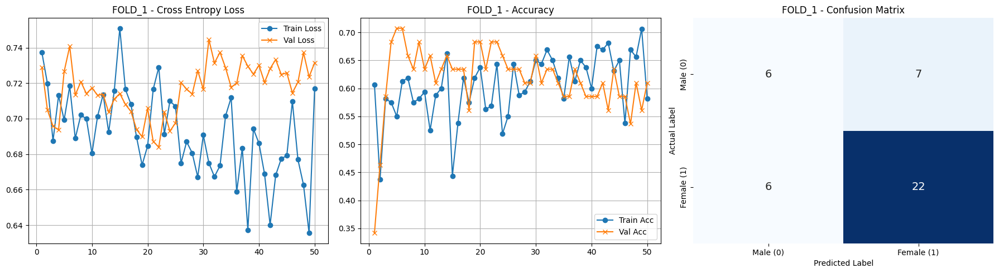


📊 CLASSIFICATION REPORT FOR FOLD_1:
              precision    recall  f1-score   support

    Male (0)       0.50      0.46      0.48        13
  Female (1)       0.76      0.79      0.77        28

    accuracy                           0.68        41
   macro avg       0.63      0.62      0.63        41
weighted avg       0.68      0.68      0.68        41

✅ FOLD_1 COMPLETE!


In [ ]:
train_bv_only_fold("Fold_1")


==================== STARTING BV FOLD_2 ====================


Epoch 01/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 01/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [01/50] | Train Loss: 0.7399 Acc: 0.4099 | Val Loss: 0.7209 Acc: 0.5500
   🌟 Val Loss improved to 0.7209. Model saved.


Epoch 02/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 02/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [02/50] | Train Loss: 0.7292 Acc: 0.5031 | Val Loss: 0.7049 Acc: 0.6500
   🌟 Val Loss improved to 0.7049. Model saved.


Epoch 03/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 03/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [03/50] | Train Loss: 0.7048 Acc: 0.5280 | Val Loss: 0.7025 Acc: 0.5500
   🌟 Val Loss improved to 0.7025. Model saved.


Epoch 04/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 04/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [04/50] | Train Loss: 0.7102 Acc: 0.5342 | Val Loss: 0.7042 Acc: 0.6500


Epoch 05/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 05/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [05/50] | Train Loss: 0.7283 Acc: 0.5528 | Val Loss: 0.7085 Acc: 0.7250


Epoch 06/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 06/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [06/50] | Train Loss: 0.7114 Acc: 0.4596 | Val Loss: 0.7076 Acc: 0.6500


Epoch 07/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 07/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [07/50] | Train Loss: 0.6776 Acc: 0.6708 | Val Loss: 0.7041 Acc: 0.7000


Epoch 08/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 08/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [08/50] | Train Loss: 0.6876 Acc: 0.5652 | Val Loss: 0.6930 Acc: 0.6250
   🌟 Val Loss improved to 0.6930. Model saved.


Epoch 09/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 09/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [09/50] | Train Loss: 0.7235 Acc: 0.4845 | Val Loss: 0.7176 Acc: 0.7250


Epoch 10/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 10/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [10/50] | Train Loss: 0.6714 Acc: 0.6646 | Val Loss: 0.7291 Acc: 0.6750


Epoch 11/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 11/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [11/50] | Train Loss: 0.6810 Acc: 0.5528 | Val Loss: 0.7359 Acc: 0.7250


Epoch 12/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 12/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [12/50] | Train Loss: 0.7026 Acc: 0.5776 | Val Loss: 0.7321 Acc: 0.7500


Epoch 13/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 13/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [13/50] | Train Loss: 0.7128 Acc: 0.5590 | Val Loss: 0.7328 Acc: 0.7500


Epoch 14/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 14/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [14/50] | Train Loss: 0.7015 Acc: 0.5528 | Val Loss: 0.7472 Acc: 0.7500


Epoch 15/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 15/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [15/50] | Train Loss: 0.6826 Acc: 0.6646 | Val Loss: 0.7280 Acc: 0.7500


Epoch 16/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 16/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [16/50] | Train Loss: 0.6887 Acc: 0.5528 | Val Loss: 0.7300 Acc: 0.7500


Epoch 17/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 17/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [17/50] | Train Loss: 0.6768 Acc: 0.5714 | Val Loss: 0.7141 Acc: 0.7750


Epoch 18/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 18/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [18/50] | Train Loss: 0.6466 Acc: 0.7019 | Val Loss: 0.7466 Acc: 0.7250


Epoch 19/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 19/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [19/50] | Train Loss: 0.7140 Acc: 0.6025 | Val Loss: 0.7518 Acc: 0.7000


Epoch 20/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 20/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [20/50] | Train Loss: 0.6897 Acc: 0.6646 | Val Loss: 0.7465 Acc: 0.7000


Epoch 21/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 21/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [21/50] | Train Loss: 0.6921 Acc: 0.5528 | Val Loss: 0.7158 Acc: 0.7000


Epoch 22/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 22/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [22/50] | Train Loss: 0.6712 Acc: 0.6832 | Val Loss: 0.7436 Acc: 0.7250


Epoch 23/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 23/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [23/50] | Train Loss: 0.6819 Acc: 0.5839 | Val Loss: 0.7415 Acc: 0.7500


Epoch 24/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 24/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [24/50] | Train Loss: 0.6851 Acc: 0.6087 | Val Loss: 0.7429 Acc: 0.7500


Epoch 25/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 25/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [25/50] | Train Loss: 0.6828 Acc: 0.6335 | Val Loss: 0.7347 Acc: 0.7250


Epoch 26/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 26/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [26/50] | Train Loss: 0.6604 Acc: 0.6398 | Val Loss: 0.7226 Acc: 0.7500


Epoch 27/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 27/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [27/50] | Train Loss: 0.6861 Acc: 0.6025 | Val Loss: 0.7202 Acc: 0.7250


Epoch 28/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 28/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [28/50] | Train Loss: 0.6943 Acc: 0.5963 | Val Loss: 0.7372 Acc: 0.7000


Epoch 29/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 29/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [29/50] | Train Loss: 0.6475 Acc: 0.6460 | Val Loss: 0.7212 Acc: 0.6750


Epoch 30/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 30/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [30/50] | Train Loss: 0.6858 Acc: 0.5963 | Val Loss: 0.7288 Acc: 0.7250


Epoch 31/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 31/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [31/50] | Train Loss: 0.6639 Acc: 0.6522 | Val Loss: 0.7446 Acc: 0.7000


Epoch 32/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 32/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [32/50] | Train Loss: 0.6396 Acc: 0.6522 | Val Loss: 0.7423 Acc: 0.7000


Epoch 33/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 33/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [33/50] | Train Loss: 0.7000 Acc: 0.5652 | Val Loss: 0.7486 Acc: 0.7000


Epoch 34/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 34/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [34/50] | Train Loss: 0.6576 Acc: 0.6335 | Val Loss: 0.7232 Acc: 0.6250


Epoch 35/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 35/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [35/50] | Train Loss: 0.7120 Acc: 0.5590 | Val Loss: 0.7352 Acc: 0.6750


Epoch 36/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 36/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [36/50] | Train Loss: 0.6393 Acc: 0.6460 | Val Loss: 0.7426 Acc: 0.6500


Epoch 37/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 37/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [37/50] | Train Loss: 0.6950 Acc: 0.5901 | Val Loss: 0.7245 Acc: 0.7000


Epoch 38/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 38/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [38/50] | Train Loss: 0.6555 Acc: 0.6273 | Val Loss: 0.7186 Acc: 0.6250
🛑 Early stopping triggered!


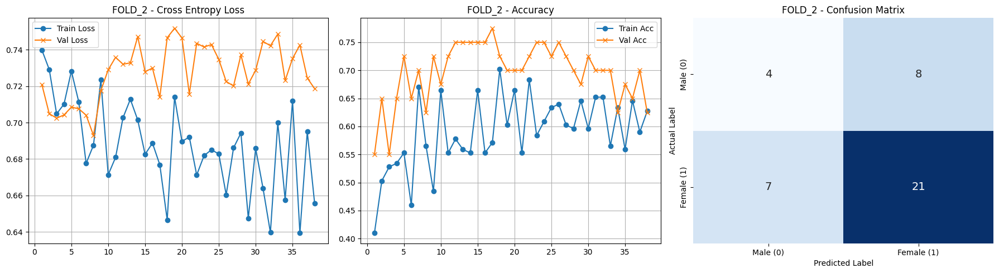


📊 CLASSIFICATION REPORT FOR FOLD_2:
              precision    recall  f1-score   support

    Male (0)       0.36      0.33      0.35        12
  Female (1)       0.72      0.75      0.74        28

    accuracy                           0.62        40
   macro avg       0.54      0.54      0.54        40
weighted avg       0.62      0.62      0.62        40

✅ FOLD_2 COMPLETE!


In [ ]:
train_bv_only_fold("Fold_2")


==================== STARTING BV FOLD_3 ====================


Epoch 01/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 01/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [01/50] | Train Loss: 0.7122 Acc: 0.5031 | Val Loss: 0.7436 Acc: 0.6500
   🌟 Val Loss improved to 0.7436. Model saved.


Epoch 02/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 02/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [02/50] | Train Loss: 0.7189 Acc: 0.5342 | Val Loss: 0.7706 Acc: 0.7000


Epoch 03/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 03/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [03/50] | Train Loss: 0.7090 Acc: 0.5839 | Val Loss: 0.7304 Acc: 0.7000
   🌟 Val Loss improved to 0.7304. Model saved.


Epoch 04/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 04/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [04/50] | Train Loss: 0.6985 Acc: 0.4969 | Val Loss: 0.7238 Acc: 0.7000
   🌟 Val Loss improved to 0.7238. Model saved.


Epoch 05/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 05/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [05/50] | Train Loss: 0.7157 Acc: 0.5342 | Val Loss: 0.7300 Acc: 0.7250


Epoch 06/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 06/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [06/50] | Train Loss: 0.6979 Acc: 0.5652 | Val Loss: 0.7609 Acc: 0.7250


Epoch 07/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 07/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [07/50] | Train Loss: 0.6733 Acc: 0.6460 | Val Loss: 0.7270 Acc: 0.7000


Epoch 08/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 08/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [08/50] | Train Loss: 0.7054 Acc: 0.4969 | Val Loss: 0.7260 Acc: 0.6250


Epoch 09/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 09/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [09/50] | Train Loss: 0.7069 Acc: 0.5714 | Val Loss: 0.7352 Acc: 0.6750


Epoch 10/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 10/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [10/50] | Train Loss: 0.7031 Acc: 0.5839 | Val Loss: 0.7251 Acc: 0.6500


Epoch 11/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 11/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [11/50] | Train Loss: 0.6780 Acc: 0.5839 | Val Loss: 0.7398 Acc: 0.6750


Epoch 12/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 12/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [12/50] | Train Loss: 0.6815 Acc: 0.6460 | Val Loss: 0.7610 Acc: 0.6500


Epoch 13/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 13/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [13/50] | Train Loss: 0.6932 Acc: 0.5217 | Val Loss: 0.7347 Acc: 0.6500


Epoch 14/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 14/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [14/50] | Train Loss: 0.7213 Acc: 0.5466 | Val Loss: 0.7551 Acc: 0.6750


Epoch 15/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 15/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [15/50] | Train Loss: 0.7052 Acc: 0.5839 | Val Loss: 0.7188 Acc: 0.5250
   🌟 Val Loss improved to 0.7188. Model saved.


Epoch 16/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 16/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [16/50] | Train Loss: 0.6851 Acc: 0.6025 | Val Loss: 0.7382 Acc: 0.5250


Epoch 17/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 17/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [17/50] | Train Loss: 0.7265 Acc: 0.5963 | Val Loss: 0.7471 Acc: 0.4750


Epoch 18/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 18/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [18/50] | Train Loss: 0.6604 Acc: 0.6460 | Val Loss: 0.7777 Acc: 0.5500


Epoch 19/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 19/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [19/50] | Train Loss: 0.7094 Acc: 0.6025 | Val Loss: 0.7968 Acc: 0.5500


Epoch 20/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 20/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [20/50] | Train Loss: 0.7222 Acc: 0.5590 | Val Loss: 0.8069 Acc: 0.5750


Epoch 21/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 21/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [21/50] | Train Loss: 0.6695 Acc: 0.6584 | Val Loss: 0.8001 Acc: 0.5250


Epoch 22/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 22/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [22/50] | Train Loss: 0.6985 Acc: 0.5466 | Val Loss: 0.7845 Acc: 0.4750


Epoch 23/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 23/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [23/50] | Train Loss: 0.6945 Acc: 0.6211 | Val Loss: 0.7775 Acc: 0.5250


Epoch 24/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 24/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [24/50] | Train Loss: 0.6706 Acc: 0.6273 | Val Loss: 0.7879 Acc: 0.5500


Epoch 25/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 25/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [25/50] | Train Loss: 0.6716 Acc: 0.6522 | Val Loss: 0.7693 Acc: 0.5500


Epoch 26/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 26/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [26/50] | Train Loss: 0.6508 Acc: 0.6335 | Val Loss: 0.7654 Acc: 0.5250


Epoch 27/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 27/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [27/50] | Train Loss: 0.6796 Acc: 0.6273 | Val Loss: 0.7803 Acc: 0.5750


Epoch 28/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 28/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [28/50] | Train Loss: 0.6741 Acc: 0.6398 | Val Loss: 0.7733 Acc: 0.5250


Epoch 29/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 29/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [29/50] | Train Loss: 0.6808 Acc: 0.6211 | Val Loss: 0.7659 Acc: 0.5250


Epoch 30/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 30/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [30/50] | Train Loss: 0.6984 Acc: 0.5901 | Val Loss: 0.7610 Acc: 0.5000


Epoch 31/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 31/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [31/50] | Train Loss: 0.6754 Acc: 0.6335 | Val Loss: 0.7901 Acc: 0.5000


Epoch 32/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 32/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [32/50] | Train Loss: 0.6862 Acc: 0.6211 | Val Loss: 0.7777 Acc: 0.5000


Epoch 33/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 33/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [33/50] | Train Loss: 0.6670 Acc: 0.6211 | Val Loss: 0.7753 Acc: 0.5250


Epoch 34/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 34/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [34/50] | Train Loss: 0.6964 Acc: 0.5466 | Val Loss: 0.7872 Acc: 0.5250


Epoch 35/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 35/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [35/50] | Train Loss: 0.6664 Acc: 0.6273 | Val Loss: 0.7660 Acc: 0.5250


Epoch 36/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 36/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [36/50] | Train Loss: 0.6973 Acc: 0.6087 | Val Loss: 0.7889 Acc: 0.5000


Epoch 37/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 37/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [37/50] | Train Loss: 0.6806 Acc: 0.6522 | Val Loss: 0.7736 Acc: 0.4750


Epoch 38/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 38/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [38/50] | Train Loss: 0.6521 Acc: 0.6211 | Val Loss: 0.7719 Acc: 0.4750


Epoch 39/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 39/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [39/50] | Train Loss: 0.6841 Acc: 0.5963 | Val Loss: 0.7725 Acc: 0.5250


Epoch 40/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 40/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [40/50] | Train Loss: 0.6993 Acc: 0.6149 | Val Loss: 0.7829 Acc: 0.5000


Epoch 41/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 41/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [41/50] | Train Loss: 0.6736 Acc: 0.6273 | Val Loss: 0.7725 Acc: 0.5250


Epoch 42/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 42/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [42/50] | Train Loss: 0.6542 Acc: 0.6211 | Val Loss: 0.7489 Acc: 0.4750


Epoch 43/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 43/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [43/50] | Train Loss: 0.6870 Acc: 0.5590 | Val Loss: 0.7679 Acc: 0.5000


Epoch 44/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 44/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [44/50] | Train Loss: 0.6679 Acc: 0.6273 | Val Loss: 0.7820 Acc: 0.4750


Epoch 45/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 45/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [45/50] | Train Loss: 0.6719 Acc: 0.6087 | Val Loss: 0.7717 Acc: 0.4500
🛑 Early stopping triggered!


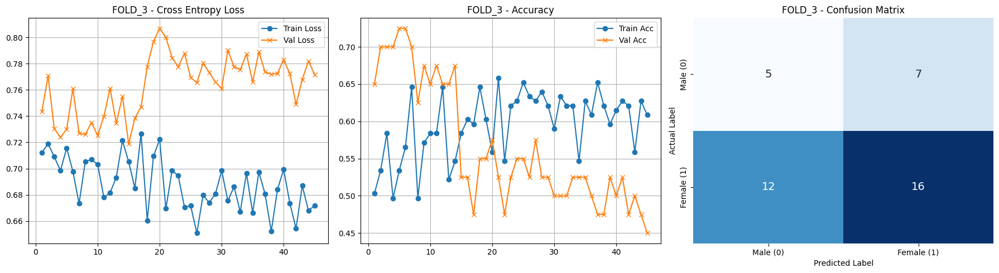


📊 CLASSIFICATION REPORT FOR FOLD_3:
              precision    recall  f1-score   support

    Male (0)       0.29      0.42      0.34        12
  Female (1)       0.70      0.57      0.63        28

    accuracy                           0.53        40
   macro avg       0.49      0.49      0.49        40
weighted avg       0.58      0.53      0.54        40

✅ FOLD_3 COMPLETE!


In [ ]:
train_bv_only_fold("Fold_3")


==================== STARTING BV FOLD_4 ====================


Epoch 01/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 01/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [01/50] | Train Loss: 0.7173 Acc: 0.4907 | Val Loss: 0.7005 Acc: 0.5750
   🌟 Val Loss improved to 0.7005. Model saved.


Epoch 02/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 02/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [02/50] | Train Loss: 0.6920 Acc: 0.5901 | Val Loss: 0.6882 Acc: 0.5750
   🌟 Val Loss improved to 0.6882. Model saved.


Epoch 03/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 03/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [03/50] | Train Loss: 0.7157 Acc: 0.4969 | Val Loss: 0.6969 Acc: 0.5250


Epoch 04/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 04/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [04/50] | Train Loss: 0.7265 Acc: 0.5280 | Val Loss: 0.7052 Acc: 0.5750


Epoch 05/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 05/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [05/50] | Train Loss: 0.6783 Acc: 0.5466 | Val Loss: 0.6920 Acc: 0.5750


Epoch 06/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 06/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [06/50] | Train Loss: 0.6615 Acc: 0.6025 | Val Loss: 0.7082 Acc: 0.6500


Epoch 07/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 07/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [07/50] | Train Loss: 0.7095 Acc: 0.6211 | Val Loss: 0.7026 Acc: 0.5250


Epoch 08/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 08/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [08/50] | Train Loss: 0.6988 Acc: 0.5714 | Val Loss: 0.7146 Acc: 0.4250


Epoch 09/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 09/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [09/50] | Train Loss: 0.6396 Acc: 0.5839 | Val Loss: 0.7042 Acc: 0.4500


Epoch 10/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 10/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [10/50] | Train Loss: 0.6936 Acc: 0.5652 | Val Loss: 0.6894 Acc: 0.6250


Epoch 11/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 11/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [11/50] | Train Loss: 0.7037 Acc: 0.5342 | Val Loss: 0.7046 Acc: 0.6000


Epoch 12/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 12/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [12/50] | Train Loss: 0.6848 Acc: 0.5776 | Val Loss: 0.7251 Acc: 0.6000


Epoch 13/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 13/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [13/50] | Train Loss: 0.7294 Acc: 0.5217 | Val Loss: 0.7301 Acc: 0.6250


Epoch 14/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 14/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [14/50] | Train Loss: 0.6862 Acc: 0.5466 | Val Loss: 0.7359 Acc: 0.5250


Epoch 15/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 15/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [15/50] | Train Loss: 0.6921 Acc: 0.5901 | Val Loss: 0.7385 Acc: 0.4250


Epoch 16/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 16/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [16/50] | Train Loss: 0.6406 Acc: 0.6398 | Val Loss: 0.7411 Acc: 0.3750


Epoch 17/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 17/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [17/50] | Train Loss: 0.7061 Acc: 0.5776 | Val Loss: 0.7248 Acc: 0.5250


Epoch 18/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 18/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [18/50] | Train Loss: 0.6630 Acc: 0.6149 | Val Loss: 0.7214 Acc: 0.4500


Epoch 19/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 19/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [19/50] | Train Loss: 0.6815 Acc: 0.5714 | Val Loss: 0.7360 Acc: 0.4500


Epoch 20/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 20/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [20/50] | Train Loss: 0.7214 Acc: 0.5714 | Val Loss: 0.7422 Acc: 0.5000


Epoch 21/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 21/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [21/50] | Train Loss: 0.6866 Acc: 0.5963 | Val Loss: 0.7624 Acc: 0.5000


Epoch 22/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 22/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [22/50] | Train Loss: 0.6627 Acc: 0.6398 | Val Loss: 0.7634 Acc: 0.4500


Epoch 23/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 23/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [23/50] | Train Loss: 0.6713 Acc: 0.6584 | Val Loss: 0.7686 Acc: 0.5000


Epoch 24/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 24/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [24/50] | Train Loss: 0.7195 Acc: 0.5466 | Val Loss: 0.7772 Acc: 0.4500


Epoch 25/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 25/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [25/50] | Train Loss: 0.6846 Acc: 0.5776 | Val Loss: 0.7530 Acc: 0.4000


Epoch 26/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 26/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [26/50] | Train Loss: 0.7092 Acc: 0.5839 | Val Loss: 0.7462 Acc: 0.4750


Epoch 27/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 27/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [27/50] | Train Loss: 0.7115 Acc: 0.5839 | Val Loss: 0.7339 Acc: 0.5000


Epoch 28/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 28/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [28/50] | Train Loss: 0.6647 Acc: 0.6335 | Val Loss: 0.7337 Acc: 0.4750


Epoch 29/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 29/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [29/50] | Train Loss: 0.6612 Acc: 0.6584 | Val Loss: 0.7437 Acc: 0.5000


Epoch 30/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 30/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [30/50] | Train Loss: 0.6735 Acc: 0.6149 | Val Loss: 0.7501 Acc: 0.5000


Epoch 31/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 31/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [31/50] | Train Loss: 0.7042 Acc: 0.5342 | Val Loss: 0.7625 Acc: 0.5500


Epoch 32/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 32/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [32/50] | Train Loss: 0.7080 Acc: 0.5528 | Val Loss: 0.7580 Acc: 0.4500
🛑 Early stopping triggered!


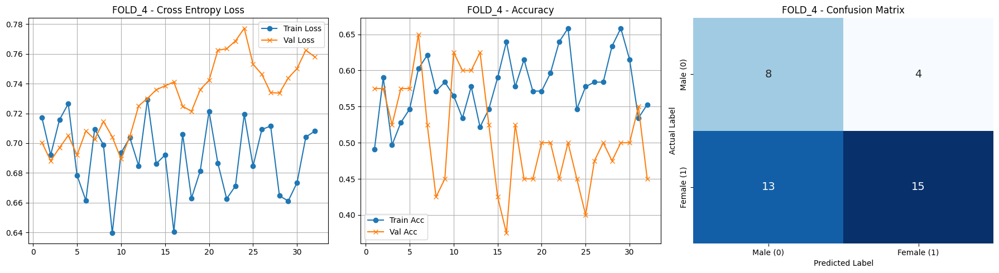


📊 CLASSIFICATION REPORT FOR FOLD_4:
              precision    recall  f1-score   support

    Male (0)       0.38      0.67      0.48        12
  Female (1)       0.79      0.54      0.64        28

    accuracy                           0.57        40
   macro avg       0.59      0.60      0.56        40
weighted avg       0.67      0.57      0.59        40

✅ FOLD_4 COMPLETE!


In [ ]:
train_bv_only_fold("Fold_4")


==================== STARTING BV FOLD_5 ====================


Epoch 01/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 01/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [01/50] | Train Loss: 0.7310 Acc: 0.4161 | Val Loss: 0.7224 Acc: 0.4000
   🌟 Val Loss improved to 0.7224. Model saved.


Epoch 02/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 02/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [02/50] | Train Loss: 0.7062 Acc: 0.5466 | Val Loss: 0.7394 Acc: 0.4250


Epoch 03/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 03/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [03/50] | Train Loss: 0.6707 Acc: 0.6149 | Val Loss: 0.7793 Acc: 0.4000


Epoch 04/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 04/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [04/50] | Train Loss: 0.6917 Acc: 0.5839 | Val Loss: 0.7884 Acc: 0.4250


Epoch 05/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 05/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [05/50] | Train Loss: 0.6821 Acc: 0.5590 | Val Loss: 0.8194 Acc: 0.3750


Epoch 06/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 06/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [06/50] | Train Loss: 0.7126 Acc: 0.5466 | Val Loss: 0.8168 Acc: 0.4000


Epoch 07/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 07/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [07/50] | Train Loss: 0.6886 Acc: 0.6398 | Val Loss: 0.8365 Acc: 0.3250


Epoch 08/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 08/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [08/50] | Train Loss: 0.6665 Acc: 0.6211 | Val Loss: 0.8474 Acc: 0.3500


Epoch 09/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 09/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [09/50] | Train Loss: 0.6912 Acc: 0.6025 | Val Loss: 0.8455 Acc: 0.4000


Epoch 10/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 10/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [10/50] | Train Loss: 0.7167 Acc: 0.5528 | Val Loss: 0.8458 Acc: 0.3500


Epoch 11/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 11/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [11/50] | Train Loss: 0.7126 Acc: 0.6087 | Val Loss: 0.8479 Acc: 0.4250


Epoch 12/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 12/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [12/50] | Train Loss: 0.6676 Acc: 0.6273 | Val Loss: 0.8493 Acc: 0.4000


Epoch 13/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 13/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [13/50] | Train Loss: 0.6888 Acc: 0.6087 | Val Loss: 0.8485 Acc: 0.3750


Epoch 14/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 14/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [14/50] | Train Loss: 0.6990 Acc: 0.6211 | Val Loss: 0.8496 Acc: 0.4750


Epoch 15/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 15/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [15/50] | Train Loss: 0.7055 Acc: 0.6149 | Val Loss: 0.8567 Acc: 0.4000


Epoch 16/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 16/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [16/50] | Train Loss: 0.7495 Acc: 0.5839 | Val Loss: 0.8633 Acc: 0.4000


Epoch 17/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 17/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [17/50] | Train Loss: 0.7088 Acc: 0.6087 | Val Loss: 0.8622 Acc: 0.3750


Epoch 18/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 18/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [18/50] | Train Loss: 0.6865 Acc: 0.6273 | Val Loss: 0.8735 Acc: 0.3250


Epoch 19/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 19/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [19/50] | Train Loss: 0.7074 Acc: 0.5901 | Val Loss: 0.8686 Acc: 0.3000


Epoch 20/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 20/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [20/50] | Train Loss: 0.6679 Acc: 0.6149 | Val Loss: 0.8539 Acc: 0.3250


Epoch 21/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 21/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [21/50] | Train Loss: 0.6906 Acc: 0.5652 | Val Loss: 0.8632 Acc: 0.3500


Epoch 22/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 22/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [22/50] | Train Loss: 0.6500 Acc: 0.6460 | Val Loss: 0.8606 Acc: 0.3500


Epoch 23/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 23/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [23/50] | Train Loss: 0.6709 Acc: 0.6335 | Val Loss: 0.8592 Acc: 0.3750


Epoch 24/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 24/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [24/50] | Train Loss: 0.6747 Acc: 0.6273 | Val Loss: 0.8594 Acc: 0.4000


Epoch 25/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 25/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [25/50] | Train Loss: 0.6579 Acc: 0.6522 | Val Loss: 0.8408 Acc: 0.4250


Epoch 26/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 26/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [26/50] | Train Loss: 0.6514 Acc: 0.6584 | Val Loss: 0.8571 Acc: 0.4500


Epoch 27/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 27/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [27/50] | Train Loss: 0.6615 Acc: 0.6522 | Val Loss: 0.8499 Acc: 0.4250


Epoch 28/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 28/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [28/50] | Train Loss: 0.6735 Acc: 0.6584 | Val Loss: 0.8466 Acc: 0.4500


Epoch 29/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 29/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [29/50] | Train Loss: 0.6460 Acc: 0.6398 | Val Loss: 0.8383 Acc: 0.4250


Epoch 30/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 30/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [30/50] | Train Loss: 0.6883 Acc: 0.5901 | Val Loss: 0.8529 Acc: 0.3500


Epoch 31/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 31/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [31/50] | Train Loss: 0.6815 Acc: 0.5776 | Val Loss: 0.8499 Acc: 0.4750
🛑 Early stopping triggered!


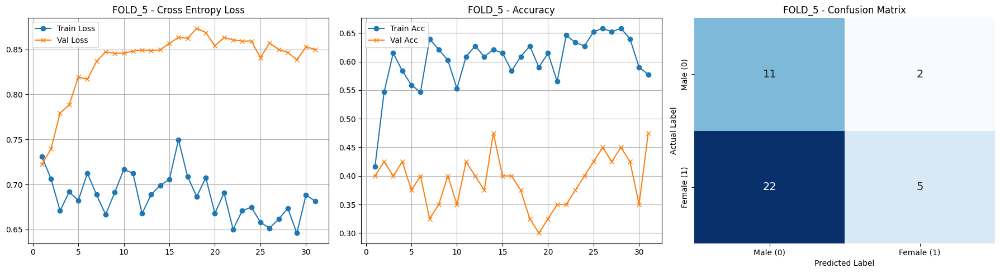


📊 CLASSIFICATION REPORT FOR FOLD_5:
              precision    recall  f1-score   support

    Male (0)       0.33      0.85      0.48        13
  Female (1)       0.71      0.19      0.29        27

    accuracy                           0.40        40
   macro avg       0.52      0.52      0.39        40
weighted avg       0.59      0.40      0.35        40

✅ FOLD_5 COMPLETE!


In [ ]:
train_bv_only_fold("Fold_5")

### NO EARLY STOPPING - HIGHEST ACC



In [ ]:
import os
import json
import copy
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
from tqdm.auto import tqdm
from collections import Counter
import matplotlib.pyplot as plt
import gc

# ==========================================
# 1. PATHS & HYPERPARAMETERS
# ==========================================
print("\n🔬 STARTING STRATEGY 4: BV-ONLY MICRO-TUNING (NO EARLY STOPPING)...\n" + "="*60)

MASTER_SPLITS_PATH = r"/content/drive/MyDrive/Major_Project/master_kfold_splits.json"
REGISTRY_PATH = r"/content/drive/MyDrive/Major_Project/dataset_split_registry.json"

SAVE_DIR = r"/content/drive/MyDrive/Major_Project/checkpoints_bv_only_no_early"
PLOT_DIR = r"/content/drive/MyDrive/Major_Project/plots_bv_only_no_early"

os.makedirs(SAVE_DIR, exist_ok=True)
os.makedirs(PLOT_DIR, exist_ok=True)

# 🚨 ANTI-OVERFITTING HYPERPARAMETERS
BATCH_SIZE = 8
NUM_EPOCHS = 50
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"[*] Hardware selected: {device}")

# ==========================================
# 2. LOAD ORIGINAL PATHS & ID MAPPING
# ==========================================
with open(REGISTRY_PATH, 'r') as f:
    registry = json.load(f)

def get_standard_id(filename):
    name = os.path.splitext(filename)[0]
    parts = name.split('_')
    if len(parts) >= 4 and parts[0] == 'dot': return f"{parts[0]}_{parts[1]}_{parts[-1]}"
    elif len(parts) >= 3 and parts[0] == 'dot': return f"{parts[0]}_{parts[1]}_{parts[-1]}"
    return name

# Map the Standard ID back to the exact physical file path from the OLD JSON
bv_id_to_path = {get_standard_id(os.path.basename(p)): p for p in registry['blood_vessel_images']}
print(f"[*] Successfully loaded {len(bv_id_to_path)} BV paths from original registry.")

# ==========================================
# 3. DATASET & TUNED TRANSFORMS
# ==========================================
class BVEggDataset(Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform

    def __len__(self): return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        filename = os.path.basename(img_path)

        # Extract label directly from BV filename
        parts = os.path.splitext(filename)[0].split('_')
        if len(parts) >= 4 and parts[0] == 'dot':
            label = int(parts[2])
        else:
            raise ValueError(f"CRITICAL ERROR: Could not parse label from {filename}")

        with Image.open(img_path) as img:
            image = img.convert('RGB')
            if self.transform: image = self.transform(image)

        return image, torch.tensor(label, dtype=torch.long)

# 🚨 TIGHT AUGMENTATION: Prevent large black borders from confusing the model
train_transforms = transforms.Compose([
    transforms.Resize((256, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=30),
    transforms.RandomAffine(degrees=0, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((256, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# ==========================================
# 4. LOAD FUSION SPLITS
# ==========================================
with open(MASTER_SPLITS_PATH, 'r') as f:
    master_splits = json.load(f)

fusion_splits = master_splits["fusion_model_splits"]

if 'fold_metrics' not in globals():
    fold_metrics = []

# ==========================================
# 5. CORE BV-ONLY TRAINING FUNCTION
# ==========================================
def train_bv_only_fold_no_early(fold_name):
    print(f"\n{'='*20} STARTING BV {fold_name.upper()} {'='*20}")

    train_ids = fusion_splits[fold_name]["train"]
    val_ids = fusion_splits[fold_name]["val"]

    train_paths = [bv_id_to_path[uid] for uid in train_ids if uid in bv_id_to_path]
    val_paths = [bv_id_to_path[uid] for uid in val_ids if uid in bv_id_to_path]

    train_dataset = BVEggDataset(train_paths, transform=train_transforms)
    val_dataset = BVEggDataset(val_paths, transform=val_transforms)

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, drop_last=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

    # Dynamic Class Weights for Imbalance
    train_labels = [int(os.path.basename(p).split('_')[2]) for p in train_paths]
    counts = Counter(train_labels)
    w0 = len(train_labels) / (2.0 * counts.get(0, 1))
    w1 = len(train_labels) / (2.0 * counts.get(1, 1))
    class_weights = torch.tensor([w0, w1], dtype=torch.float).to(device)

    # 🚨 ANTI-OVERFITTING: EXTREME FREEZING
    model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)
    for param in model.features.parameters():
        param.requires_grad = False

    # Build Custom Classifier Head with 50% Dropout
    num_features = model.classifier[1].in_features
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.5, inplace=True),
        nn.Linear(num_features, 2)
    )
    model = model.to(device)

    # 🚨 ANTI-OVERFITTING: Label Smoothing (0.1) & Strong Weight Decay
    criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.1)
    optimizer = optim.AdamW(model.classifier.parameters(), lr=1e-3, weight_decay=1e-2)

    # 🚨 ANTI-OVERFITTING: Cosine Annealing Learning Rate
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS, eta_min=1e-6)

    best_val_loss = float('inf')
    best_val_acc = 0.0
    best_model_wts = copy.deepcopy(model.state_dict())
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

    for epoch in range(NUM_EPOCHS):
        model.train()
        train_loss, train_corrects, train_total = 0.0, 0, 0
        train_pbar = tqdm(train_loader, desc=f"Epoch {epoch+1:02d}/{NUM_EPOCHS} [Train]", leave=False)
        for inputs, labels in train_pbar:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()

            # 🚨 ANTI-OVERFITTING: Gradient Clipping
            torch.nn.utils.clip_grad_norm_(model.classifier.parameters(), max_norm=1.0)

            optimizer.step()
            train_loss += loss.item() * inputs.size(0)
            train_corrects += torch.sum(torch.max(outputs, 1)[1] == labels.data).item()
            train_total += labels.size(0)

        epoch_train_loss = train_loss / len(train_dataset)
        epoch_train_acc = train_corrects / len(train_dataset)

        model.eval()
        val_loss, val_corrects = 0.0, 0
        val_pbar = tqdm(val_loader, desc=f"Epoch {epoch+1:02d}/{NUM_EPOCHS} [Val BV]", leave=False)
        with torch.no_grad():
            for inputs, labels in val_pbar:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * inputs.size(0)
                val_corrects += torch.sum(torch.max(outputs, 1)[1] == labels.data).item()

        epoch_val_loss = val_loss / len(val_dataset)
        epoch_val_acc = val_corrects / len(val_dataset)

        # Step the Cosine Scheduler
        scheduler.step()

        history['train_loss'].append(epoch_train_loss)
        history['val_loss'].append(epoch_val_loss)
        history['train_acc'].append(epoch_train_acc)
        history['val_acc'].append(epoch_val_acc)

        print(f"Epoch [{epoch+1:02d}/{NUM_EPOCHS}] | Train Loss: {epoch_train_loss:.4f} Acc: {epoch_train_acc:.4f} | Val Loss: {epoch_val_loss:.4f} Acc: {epoch_val_acc:.4f}")

        # Checkpointing (Saves the best model, but does NOT stop early)
        if epoch_val_loss < best_val_loss:
            best_val_loss, best_val_acc = epoch_val_loss, epoch_val_acc
            best_model_wts = copy.deepcopy(model.state_dict())
            print(f"   🌟 Val Loss improved to {epoch_val_loss:.4f}. Model saved.")

    # Save the optimal weights after full training
    model.load_state_dict(best_model_wts)
    torch.save(model.state_dict(), os.path.join(SAVE_DIR, f"effnet_bv_only_{fold_name}.pth"))

    # Update Global Metrics Tracking
    global fold_metrics
    fold_metrics = [m for m in fold_metrics if m['fold'] != fold_name]
    fold_metrics.append({'fold': fold_name, 'loss': best_val_loss, 'acc': best_val_acc})

    # Plot the beautiful learning curves
    epochs_range = range(1, len(history['train_loss']) + 1)
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, history['train_loss'], label='Train Loss', marker='o')
    plt.plot(epochs_range, history['val_loss'], label='Val Loss', marker='x')
    plt.title(f'{fold_name.upper()} - Cross Entropy Loss')
    plt.legend(); plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, history['train_acc'], label='Train Acc', marker='o')
    plt.plot(epochs_range, history['val_acc'], label='Val Acc', marker='x')
    plt.title(f'{fold_name.upper()} - Accuracy')
    plt.legend(); plt.grid(True)

    plt.tight_layout()
    plt.savefig(os.path.join(PLOT_DIR, f"{fold_name}_bv_curves.png"), dpi=300)
    plt.show()

    del model, optimizer, train_loader, val_loader, train_dataset, val_dataset
    torch.cuda.empty_cache()
    gc.collect()
    print(f"✅ {fold_name.upper()} COMPLETE!")

print("✅ Setup complete! You can now run the cells below.")


🔬 STARTING STRATEGY 4: BV-ONLY MICRO-TUNING (NO EARLY STOPPING)...
[*] Hardware selected: cpu
[*] Successfully loaded 201 BV paths from original registry.
✅ Setup complete! You can now run the cells below.



==================== STARTING BV FOLD_1 ====================
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 136MB/s]


Epoch 01/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 01/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [01/50] | Train Loss: 0.7380 Acc: 0.4313 | Val Loss: 0.7027 Acc: 0.5366
   🌟 Val Loss improved to 0.7027. Model saved.


Epoch 02/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 02/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [02/50] | Train Loss: 0.7068 Acc: 0.5687 | Val Loss: 0.6934 Acc: 0.5854
   🌟 Val Loss improved to 0.6934. Model saved.


Epoch 03/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 03/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [03/50] | Train Loss: 0.6975 Acc: 0.6687 | Val Loss: 0.7043 Acc: 0.5854


Epoch 04/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 04/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [04/50] | Train Loss: 0.7009 Acc: 0.5250 | Val Loss: 0.7130 Acc: 0.5610


Epoch 05/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 05/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [05/50] | Train Loss: 0.6996 Acc: 0.5938 | Val Loss: 0.7147 Acc: 0.5854


Epoch 06/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 06/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [06/50] | Train Loss: 0.7243 Acc: 0.5375 | Val Loss: 0.7140 Acc: 0.6341


Epoch 07/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 07/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [07/50] | Train Loss: 0.6912 Acc: 0.5750 | Val Loss: 0.7094 Acc: 0.6098


Epoch 08/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 08/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [08/50] | Train Loss: 0.6980 Acc: 0.6125 | Val Loss: 0.7080 Acc: 0.7073


Epoch 09/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 09/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [09/50] | Train Loss: 0.7206 Acc: 0.6062 | Val Loss: 0.7144 Acc: 0.6341


Epoch 10/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 10/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [10/50] | Train Loss: 0.6983 Acc: 0.5563 | Val Loss: 0.7102 Acc: 0.6341


Epoch 11/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 11/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [11/50] | Train Loss: 0.6855 Acc: 0.5813 | Val Loss: 0.7068 Acc: 0.6829


Epoch 12/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 12/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [12/50] | Train Loss: 0.7312 Acc: 0.5938 | Val Loss: 0.7231 Acc: 0.6341


Epoch 13/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 13/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [13/50] | Train Loss: 0.7014 Acc: 0.6000 | Val Loss: 0.7017 Acc: 0.5854


Epoch 14/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 14/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [14/50] | Train Loss: 0.7140 Acc: 0.5938 | Val Loss: 0.6913 Acc: 0.5610
   🌟 Val Loss improved to 0.6913. Model saved.


Epoch 15/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 15/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [15/50] | Train Loss: 0.6938 Acc: 0.5563 | Val Loss: 0.7006 Acc: 0.5366


Epoch 16/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 16/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [16/50] | Train Loss: 0.7409 Acc: 0.6062 | Val Loss: 0.7111 Acc: 0.6341


Epoch 17/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 17/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [17/50] | Train Loss: 0.7103 Acc: 0.6188 | Val Loss: 0.7203 Acc: 0.5366


Epoch 18/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 18/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [18/50] | Train Loss: 0.6928 Acc: 0.6125 | Val Loss: 0.7186 Acc: 0.4878


Epoch 19/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 19/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [19/50] | Train Loss: 0.6846 Acc: 0.6312 | Val Loss: 0.7170 Acc: 0.5122


Epoch 20/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 20/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [20/50] | Train Loss: 0.6814 Acc: 0.6062 | Val Loss: 0.7225 Acc: 0.5610


Epoch 21/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 21/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [21/50] | Train Loss: 0.6765 Acc: 0.5500 | Val Loss: 0.7380 Acc: 0.6098


Epoch 22/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 22/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [22/50] | Train Loss: 0.6839 Acc: 0.6375 | Val Loss: 0.7553 Acc: 0.6341


Epoch 23/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 23/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [23/50] | Train Loss: 0.7027 Acc: 0.5875 | Val Loss: 0.7350 Acc: 0.6098


Epoch 24/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 24/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [24/50] | Train Loss: 0.7188 Acc: 0.5437 | Val Loss: 0.7256 Acc: 0.6585


Epoch 25/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 25/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [25/50] | Train Loss: 0.6762 Acc: 0.6375 | Val Loss: 0.7307 Acc: 0.6098


Epoch 26/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 26/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [26/50] | Train Loss: 0.7147 Acc: 0.5813 | Val Loss: 0.7243 Acc: 0.5854


Epoch 27/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 27/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [27/50] | Train Loss: 0.6553 Acc: 0.6750 | Val Loss: 0.7312 Acc: 0.5854


Epoch 28/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 28/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [28/50] | Train Loss: 0.6717 Acc: 0.6250 | Val Loss: 0.7463 Acc: 0.6585


Epoch 29/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 29/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [29/50] | Train Loss: 0.7110 Acc: 0.5875 | Val Loss: 0.7296 Acc: 0.6098


Epoch 30/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 30/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [30/50] | Train Loss: 0.6898 Acc: 0.5938 | Val Loss: 0.7323 Acc: 0.6098


Epoch 31/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 31/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [31/50] | Train Loss: 0.7037 Acc: 0.5750 | Val Loss: 0.7161 Acc: 0.6098


Epoch 32/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 32/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [32/50] | Train Loss: 0.6700 Acc: 0.6625 | Val Loss: 0.7212 Acc: 0.5854


Epoch 33/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 33/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [33/50] | Train Loss: 0.6852 Acc: 0.6000 | Val Loss: 0.7267 Acc: 0.5854


Epoch 34/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 34/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [34/50] | Train Loss: 0.7306 Acc: 0.5437 | Val Loss: 0.7269 Acc: 0.5854


Epoch 35/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 35/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [35/50] | Train Loss: 0.6523 Acc: 0.6875 | Val Loss: 0.7276 Acc: 0.6098


Epoch 36/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 36/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [36/50] | Train Loss: 0.6873 Acc: 0.5625 | Val Loss: 0.7325 Acc: 0.5854


Epoch 37/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 37/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [37/50] | Train Loss: 0.6464 Acc: 0.6562 | Val Loss: 0.7363 Acc: 0.5854


Epoch 38/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 38/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [38/50] | Train Loss: 0.6743 Acc: 0.6312 | Val Loss: 0.7317 Acc: 0.5854


Epoch 39/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 39/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [39/50] | Train Loss: 0.7066 Acc: 0.5750 | Val Loss: 0.7467 Acc: 0.6098


Epoch 40/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 40/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [40/50] | Train Loss: 0.6404 Acc: 0.6625 | Val Loss: 0.7391 Acc: 0.6098


Epoch 41/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 41/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [41/50] | Train Loss: 0.6378 Acc: 0.6750 | Val Loss: 0.7283 Acc: 0.6341


Epoch 42/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 42/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [42/50] | Train Loss: 0.6809 Acc: 0.6188 | Val Loss: 0.7489 Acc: 0.5854


Epoch 43/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 43/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [43/50] | Train Loss: 0.6686 Acc: 0.6375 | Val Loss: 0.7477 Acc: 0.6098


Epoch 44/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 44/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [44/50] | Train Loss: 0.6668 Acc: 0.6250 | Val Loss: 0.7433 Acc: 0.6341


Epoch 45/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 45/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [45/50] | Train Loss: 0.6597 Acc: 0.6312 | Val Loss: 0.7254 Acc: 0.5854


Epoch 46/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 46/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [46/50] | Train Loss: 0.7037 Acc: 0.5875 | Val Loss: 0.7229 Acc: 0.5854


Epoch 47/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 47/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [47/50] | Train Loss: 0.6913 Acc: 0.6125 | Val Loss: 0.7387 Acc: 0.6098


Epoch 48/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 48/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [48/50] | Train Loss: 0.6934 Acc: 0.6312 | Val Loss: 0.7380 Acc: 0.6585


Epoch 49/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 49/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [49/50] | Train Loss: 0.6883 Acc: 0.6375 | Val Loss: 0.7352 Acc: 0.5854


Epoch 50/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 50/50 [Val BV]:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch [50/50] | Train Loss: 0.6641 Acc: 0.6687 | Val Loss: 0.7329 Acc: 0.6098


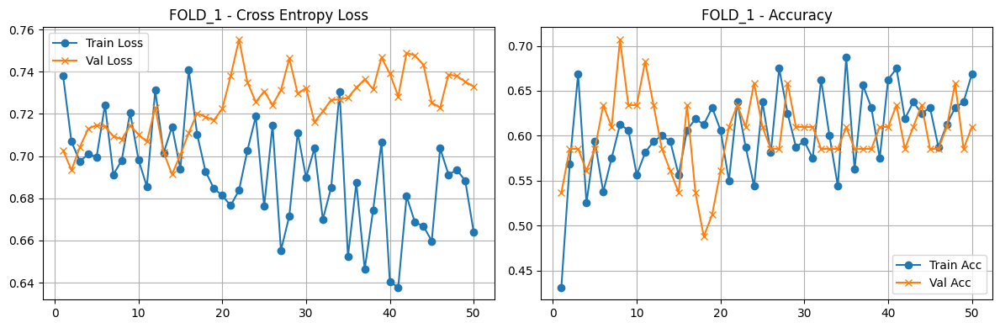

✅ FOLD_1 COMPLETE!


In [ ]:
train_bv_only_fold_no_early("Fold_1")


==================== STARTING BV FOLD_2 ====================


Epoch 01/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 01/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [01/50] | Train Loss: 0.7329 Acc: 0.5714 | Val Loss: 0.7299 Acc: 0.3250
   🌟 Val Loss improved to 0.7299. Model saved.


Epoch 02/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 02/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [02/50] | Train Loss: 0.7195 Acc: 0.4783 | Val Loss: 0.7315 Acc: 0.3750


Epoch 03/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 03/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [03/50] | Train Loss: 0.7267 Acc: 0.4224 | Val Loss: 0.7225 Acc: 0.4000
   🌟 Val Loss improved to 0.7225. Model saved.


Epoch 04/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 04/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [04/50] | Train Loss: 0.6694 Acc: 0.5839 | Val Loss: 0.7123 Acc: 0.6000
   🌟 Val Loss improved to 0.7123. Model saved.


Epoch 05/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 05/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [05/50] | Train Loss: 0.7013 Acc: 0.6646 | Val Loss: 0.7093 Acc: 0.6000
   🌟 Val Loss improved to 0.7093. Model saved.


Epoch 06/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 06/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [06/50] | Train Loss: 0.6989 Acc: 0.5528 | Val Loss: 0.6985 Acc: 0.4500
   🌟 Val Loss improved to 0.6985. Model saved.


Epoch 07/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 07/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [07/50] | Train Loss: 0.7096 Acc: 0.5155 | Val Loss: 0.6951 Acc: 0.5750
   🌟 Val Loss improved to 0.6951. Model saved.


Epoch 08/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 08/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [08/50] | Train Loss: 0.6898 Acc: 0.5714 | Val Loss: 0.7149 Acc: 0.7250


Epoch 09/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 09/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [09/50] | Train Loss: 0.6591 Acc: 0.6584 | Val Loss: 0.7309 Acc: 0.6750


Epoch 10/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 10/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [10/50] | Train Loss: 0.7130 Acc: 0.5963 | Val Loss: 0.7216 Acc: 0.6750


Epoch 11/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 11/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [11/50] | Train Loss: 0.7151 Acc: 0.5776 | Val Loss: 0.7178 Acc: 0.6250


Epoch 12/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 12/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [12/50] | Train Loss: 0.7341 Acc: 0.5466 | Val Loss: 0.7593 Acc: 0.7000


Epoch 13/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 13/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [13/50] | Train Loss: 0.6990 Acc: 0.6149 | Val Loss: 0.7252 Acc: 0.6250


Epoch 14/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 14/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [14/50] | Train Loss: 0.7114 Acc: 0.5466 | Val Loss: 0.7181 Acc: 0.6500


Epoch 15/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 15/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [15/50] | Train Loss: 0.6970 Acc: 0.5714 | Val Loss: 0.7315 Acc: 0.6250


Epoch 16/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 16/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [16/50] | Train Loss: 0.6700 Acc: 0.6584 | Val Loss: 0.7469 Acc: 0.6250


Epoch 17/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 17/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [17/50] | Train Loss: 0.6680 Acc: 0.6025 | Val Loss: 0.7314 Acc: 0.6500


Epoch 18/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 18/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [18/50] | Train Loss: 0.7159 Acc: 0.5342 | Val Loss: 0.7322 Acc: 0.6500


Epoch 19/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 19/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [19/50] | Train Loss: 0.6675 Acc: 0.6584 | Val Loss: 0.7303 Acc: 0.6500


Epoch 20/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 20/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [20/50] | Train Loss: 0.6367 Acc: 0.6770 | Val Loss: 0.7368 Acc: 0.6250


Epoch 21/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 21/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [21/50] | Train Loss: 0.7033 Acc: 0.5590 | Val Loss: 0.7339 Acc: 0.6250


Epoch 22/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 22/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [22/50] | Train Loss: 0.7005 Acc: 0.5590 | Val Loss: 0.7484 Acc: 0.6500


Epoch 23/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 23/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [23/50] | Train Loss: 0.6805 Acc: 0.6832 | Val Loss: 0.7306 Acc: 0.6250


Epoch 24/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 24/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [24/50] | Train Loss: 0.6735 Acc: 0.6025 | Val Loss: 0.7261 Acc: 0.6750


Epoch 25/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 25/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [25/50] | Train Loss: 0.6906 Acc: 0.5839 | Val Loss: 0.7264 Acc: 0.6500


Epoch 26/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 26/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [26/50] | Train Loss: 0.7060 Acc: 0.5901 | Val Loss: 0.7223 Acc: 0.6250


Epoch 27/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 27/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [27/50] | Train Loss: 0.6825 Acc: 0.5963 | Val Loss: 0.7494 Acc: 0.6000


Epoch 28/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 28/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [28/50] | Train Loss: 0.6956 Acc: 0.6025 | Val Loss: 0.7385 Acc: 0.6000


Epoch 29/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 29/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [29/50] | Train Loss: 0.6846 Acc: 0.5901 | Val Loss: 0.7346 Acc: 0.6000


Epoch 30/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 30/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [30/50] | Train Loss: 0.7041 Acc: 0.6211 | Val Loss: 0.7296 Acc: 0.6000


Epoch 31/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 31/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [31/50] | Train Loss: 0.6690 Acc: 0.5901 | Val Loss: 0.7248 Acc: 0.6250


Epoch 32/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 32/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [32/50] | Train Loss: 0.6696 Acc: 0.6460 | Val Loss: 0.7366 Acc: 0.6000


Epoch 33/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 33/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [33/50] | Train Loss: 0.6572 Acc: 0.6398 | Val Loss: 0.7312 Acc: 0.6250


Epoch 34/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 34/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [34/50] | Train Loss: 0.6773 Acc: 0.6211 | Val Loss: 0.7352 Acc: 0.5750


Epoch 35/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 35/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [35/50] | Train Loss: 0.7120 Acc: 0.5652 | Val Loss: 0.7282 Acc: 0.5750


Epoch 36/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 36/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [36/50] | Train Loss: 0.7268 Acc: 0.5466 | Val Loss: 0.7162 Acc: 0.6250


Epoch 37/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 37/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [37/50] | Train Loss: 0.6982 Acc: 0.5901 | Val Loss: 0.7203 Acc: 0.6000


Epoch 38/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 38/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [38/50] | Train Loss: 0.6627 Acc: 0.6335 | Val Loss: 0.7219 Acc: 0.6500


Epoch 39/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 39/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [39/50] | Train Loss: 0.6745 Acc: 0.6894 | Val Loss: 0.7314 Acc: 0.6250


Epoch 40/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 40/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [40/50] | Train Loss: 0.6798 Acc: 0.5839 | Val Loss: 0.7282 Acc: 0.6250


Epoch 41/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 41/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [41/50] | Train Loss: 0.6583 Acc: 0.6211 | Val Loss: 0.7258 Acc: 0.6000


Epoch 42/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 42/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [42/50] | Train Loss: 0.6937 Acc: 0.5528 | Val Loss: 0.7297 Acc: 0.6000


Epoch 43/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 43/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [43/50] | Train Loss: 0.7040 Acc: 0.5839 | Val Loss: 0.7147 Acc: 0.6500


Epoch 44/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 44/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [44/50] | Train Loss: 0.6465 Acc: 0.6708 | Val Loss: 0.7274 Acc: 0.6250


Epoch 45/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 45/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [45/50] | Train Loss: 0.6603 Acc: 0.6522 | Val Loss: 0.7280 Acc: 0.6250


Epoch 46/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 46/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [46/50] | Train Loss: 0.7016 Acc: 0.5839 | Val Loss: 0.7238 Acc: 0.6250


Epoch 47/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 47/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [47/50] | Train Loss: 0.6989 Acc: 0.5776 | Val Loss: 0.7308 Acc: 0.6500


Epoch 48/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 48/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [48/50] | Train Loss: 0.6558 Acc: 0.6087 | Val Loss: 0.7270 Acc: 0.6000


Epoch 49/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 49/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [49/50] | Train Loss: 0.6704 Acc: 0.5901 | Val Loss: 0.7323 Acc: 0.6000


Epoch 50/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 50/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [50/50] | Train Loss: 0.6698 Acc: 0.6398 | Val Loss: 0.7323 Acc: 0.6000


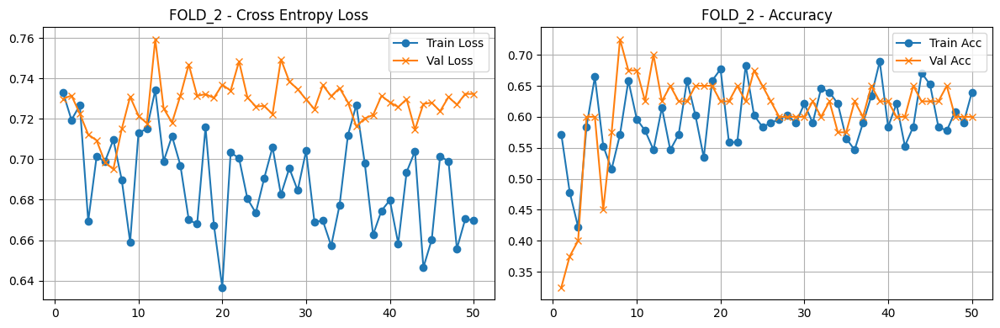

✅ FOLD_2 COMPLETE!


In [ ]:
train_bv_only_fold_no_early("Fold_2")


==================== STARTING BV FOLD_3 ====================


Epoch 01/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 01/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [01/50] | Train Loss: 0.7266 Acc: 0.5280 | Val Loss: 0.7154 Acc: 0.6500
   🌟 Val Loss improved to 0.7154. Model saved.


Epoch 02/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 02/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [02/50] | Train Loss: 0.7326 Acc: 0.5031 | Val Loss: 0.7201 Acc: 0.5500


Epoch 03/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 03/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [03/50] | Train Loss: 0.7004 Acc: 0.5839 | Val Loss: 0.7300 Acc: 0.4000


Epoch 04/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 04/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [04/50] | Train Loss: 0.7084 Acc: 0.5280 | Val Loss: 0.7263 Acc: 0.4250


Epoch 05/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 05/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [05/50] | Train Loss: 0.7224 Acc: 0.5839 | Val Loss: 0.7297 Acc: 0.5000


Epoch 06/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 06/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [06/50] | Train Loss: 0.7086 Acc: 0.6149 | Val Loss: 0.7155 Acc: 0.4500


Epoch 07/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 07/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [07/50] | Train Loss: 0.6937 Acc: 0.5590 | Val Loss: 0.7031 Acc: 0.6250
   🌟 Val Loss improved to 0.7031. Model saved.


Epoch 08/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 08/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [08/50] | Train Loss: 0.7102 Acc: 0.5652 | Val Loss: 0.7046 Acc: 0.5500


Epoch 09/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 09/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [09/50] | Train Loss: 0.7025 Acc: 0.5280 | Val Loss: 0.7377 Acc: 0.7000


Epoch 10/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 10/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [10/50] | Train Loss: 0.7044 Acc: 0.5714 | Val Loss: 0.7289 Acc: 0.6500


Epoch 11/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 11/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [11/50] | Train Loss: 0.6978 Acc: 0.6087 | Val Loss: 0.7452 Acc: 0.6500


Epoch 12/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 12/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [12/50] | Train Loss: 0.7161 Acc: 0.5528 | Val Loss: 0.7503 Acc: 0.6000


Epoch 13/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 13/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [13/50] | Train Loss: 0.6971 Acc: 0.5528 | Val Loss: 0.7346 Acc: 0.6000


Epoch 14/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 14/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [14/50] | Train Loss: 0.6737 Acc: 0.5404 | Val Loss: 0.7678 Acc: 0.7000


Epoch 15/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 15/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [15/50] | Train Loss: 0.7333 Acc: 0.6149 | Val Loss: 0.8022 Acc: 0.7000


Epoch 16/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 16/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [16/50] | Train Loss: 0.7111 Acc: 0.5217 | Val Loss: 0.7671 Acc: 0.6250


Epoch 17/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 17/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [17/50] | Train Loss: 0.7107 Acc: 0.5714 | Val Loss: 0.8038 Acc: 0.6750


Epoch 18/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 18/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [18/50] | Train Loss: 0.6602 Acc: 0.6211 | Val Loss: 0.7662 Acc: 0.6250


Epoch 19/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 19/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [19/50] | Train Loss: 0.6628 Acc: 0.6646 | Val Loss: 0.7513 Acc: 0.6750


Epoch 20/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 20/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [20/50] | Train Loss: 0.6969 Acc: 0.5590 | Val Loss: 0.7516 Acc: 0.6000


Epoch 21/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 21/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [21/50] | Train Loss: 0.6791 Acc: 0.6211 | Val Loss: 0.7355 Acc: 0.5750


Epoch 22/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 22/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [22/50] | Train Loss: 0.6671 Acc: 0.5652 | Val Loss: 0.7436 Acc: 0.6000


Epoch 23/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 23/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [23/50] | Train Loss: 0.7121 Acc: 0.5652 | Val Loss: 0.7616 Acc: 0.6500


Epoch 24/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 24/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [24/50] | Train Loss: 0.7000 Acc: 0.5714 | Val Loss: 0.7556 Acc: 0.5750


Epoch 25/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 25/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [25/50] | Train Loss: 0.6393 Acc: 0.6584 | Val Loss: 0.7371 Acc: 0.5500


Epoch 26/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 26/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [26/50] | Train Loss: 0.7157 Acc: 0.6087 | Val Loss: 0.7333 Acc: 0.5500


Epoch 27/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 27/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [27/50] | Train Loss: 0.6467 Acc: 0.6708 | Val Loss: 0.7523 Acc: 0.5500


Epoch 28/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 28/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [28/50] | Train Loss: 0.6876 Acc: 0.5963 | Val Loss: 0.7475 Acc: 0.6000


Epoch 29/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 29/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [29/50] | Train Loss: 0.6915 Acc: 0.5839 | Val Loss: 0.7720 Acc: 0.6500


Epoch 30/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 30/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [30/50] | Train Loss: 0.6611 Acc: 0.6894 | Val Loss: 0.7673 Acc: 0.6250


Epoch 31/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 31/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [31/50] | Train Loss: 0.6908 Acc: 0.5901 | Val Loss: 0.7434 Acc: 0.5500


Epoch 32/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 32/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [32/50] | Train Loss: 0.6759 Acc: 0.6398 | Val Loss: 0.7602 Acc: 0.5750


Epoch 33/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 33/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [33/50] | Train Loss: 0.6878 Acc: 0.5714 | Val Loss: 0.7693 Acc: 0.6750


Epoch 34/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 34/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [34/50] | Train Loss: 0.7022 Acc: 0.5714 | Val Loss: 0.7845 Acc: 0.6750


Epoch 35/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 35/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [35/50] | Train Loss: 0.6901 Acc: 0.6087 | Val Loss: 0.7586 Acc: 0.5500


Epoch 36/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 36/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [36/50] | Train Loss: 0.6301 Acc: 0.6522 | Val Loss: 0.7590 Acc: 0.6250


Epoch 37/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 37/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [37/50] | Train Loss: 0.6748 Acc: 0.5901 | Val Loss: 0.7464 Acc: 0.6500


Epoch 38/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 38/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [38/50] | Train Loss: 0.6436 Acc: 0.6398 | Val Loss: 0.7450 Acc: 0.5250


Epoch 39/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 39/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [39/50] | Train Loss: 0.6963 Acc: 0.6273 | Val Loss: 0.7502 Acc: 0.5750


Epoch 40/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 40/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [40/50] | Train Loss: 0.6594 Acc: 0.6584 | Val Loss: 0.7522 Acc: 0.5250


Epoch 41/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 41/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [41/50] | Train Loss: 0.6924 Acc: 0.6273 | Val Loss: 0.7621 Acc: 0.5250


Epoch 42/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 42/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [42/50] | Train Loss: 0.6919 Acc: 0.6273 | Val Loss: 0.7659 Acc: 0.6000


Epoch 43/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 43/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [43/50] | Train Loss: 0.6962 Acc: 0.5590 | Val Loss: 0.7653 Acc: 0.5750


Epoch 44/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 44/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [44/50] | Train Loss: 0.6692 Acc: 0.6335 | Val Loss: 0.7608 Acc: 0.5750


Epoch 45/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 45/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [45/50] | Train Loss: 0.6549 Acc: 0.6460 | Val Loss: 0.7647 Acc: 0.5500


Epoch 46/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 46/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [46/50] | Train Loss: 0.7089 Acc: 0.6025 | Val Loss: 0.7671 Acc: 0.5250


Epoch 47/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 47/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [47/50] | Train Loss: 0.6448 Acc: 0.5901 | Val Loss: 0.7692 Acc: 0.5250


Epoch 48/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 48/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [48/50] | Train Loss: 0.6538 Acc: 0.6646 | Val Loss: 0.7627 Acc: 0.5750


Epoch 49/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 49/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [49/50] | Train Loss: 0.6607 Acc: 0.6273 | Val Loss: 0.7572 Acc: 0.5500


Epoch 50/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 50/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [50/50] | Train Loss: 0.6741 Acc: 0.6460 | Val Loss: 0.7709 Acc: 0.6500


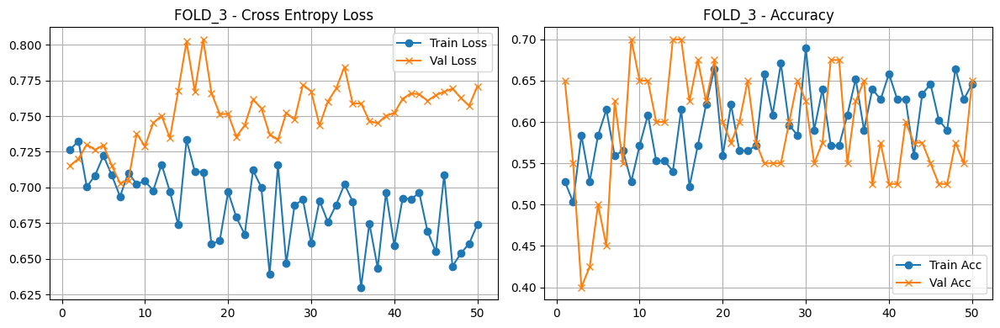

✅ FOLD_3 COMPLETE!


In [ ]:
train_bv_only_fold_no_early("Fold_3")


==================== STARTING BV FOLD_4 ====================


Epoch 01/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 01/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [01/50] | Train Loss: 0.7385 Acc: 0.5342 | Val Loss: 0.7571 Acc: 0.6750
   🌟 Val Loss improved to 0.7571. Model saved.


Epoch 02/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 02/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [02/50] | Train Loss: 0.6762 Acc: 0.5652 | Val Loss: 0.7553 Acc: 0.4250
   🌟 Val Loss improved to 0.7553. Model saved.


Epoch 03/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 03/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [03/50] | Train Loss: 0.7066 Acc: 0.5901 | Val Loss: 0.7465 Acc: 0.4000
   🌟 Val Loss improved to 0.7465. Model saved.


Epoch 04/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 04/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [04/50] | Train Loss: 0.7068 Acc: 0.5280 | Val Loss: 0.7319 Acc: 0.4500
   🌟 Val Loss improved to 0.7319. Model saved.


Epoch 05/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 05/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [05/50] | Train Loss: 0.7170 Acc: 0.4534 | Val Loss: 0.7364 Acc: 0.4750


Epoch 06/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 06/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [06/50] | Train Loss: 0.6831 Acc: 0.6398 | Val Loss: 0.7474 Acc: 0.5000


Epoch 07/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 07/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [07/50] | Train Loss: 0.7145 Acc: 0.5714 | Val Loss: 0.7337 Acc: 0.3750


Epoch 08/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 08/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [08/50] | Train Loss: 0.7088 Acc: 0.5839 | Val Loss: 0.7371 Acc: 0.3500


Epoch 09/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 09/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [09/50] | Train Loss: 0.6770 Acc: 0.6522 | Val Loss: 0.7558 Acc: 0.4000


Epoch 10/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 10/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [10/50] | Train Loss: 0.6958 Acc: 0.5776 | Val Loss: 0.7652 Acc: 0.4750


Epoch 11/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 11/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [11/50] | Train Loss: 0.7220 Acc: 0.5714 | Val Loss: 0.7633 Acc: 0.4750


Epoch 12/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 12/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [12/50] | Train Loss: 0.6914 Acc: 0.5280 | Val Loss: 0.7607 Acc: 0.3250


Epoch 13/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 13/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [13/50] | Train Loss: 0.6977 Acc: 0.6398 | Val Loss: 0.7585 Acc: 0.4750


Epoch 14/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 14/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [14/50] | Train Loss: 0.6975 Acc: 0.5839 | Val Loss: 0.7664 Acc: 0.3250


Epoch 15/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 15/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [15/50] | Train Loss: 0.6981 Acc: 0.5776 | Val Loss: 0.7675 Acc: 0.4000


Epoch 16/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 16/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [16/50] | Train Loss: 0.6534 Acc: 0.6211 | Val Loss: 0.7563 Acc: 0.3750


Epoch 17/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 17/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [17/50] | Train Loss: 0.6619 Acc: 0.5342 | Val Loss: 0.7575 Acc: 0.4000


Epoch 18/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 18/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [18/50] | Train Loss: 0.6837 Acc: 0.6149 | Val Loss: 0.7826 Acc: 0.4000


Epoch 19/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 19/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [19/50] | Train Loss: 0.6726 Acc: 0.6211 | Val Loss: 0.7810 Acc: 0.3500


Epoch 20/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 20/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [20/50] | Train Loss: 0.6342 Acc: 0.6894 | Val Loss: 0.7845 Acc: 0.4250


Epoch 21/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 21/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [21/50] | Train Loss: 0.6679 Acc: 0.6149 | Val Loss: 0.8000 Acc: 0.4000


Epoch 22/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 22/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [22/50] | Train Loss: 0.6834 Acc: 0.6087 | Val Loss: 0.7720 Acc: 0.3750


Epoch 23/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 23/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [23/50] | Train Loss: 0.6392 Acc: 0.6770 | Val Loss: 0.7788 Acc: 0.4250


Epoch 24/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 24/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [24/50] | Train Loss: 0.6708 Acc: 0.6522 | Val Loss: 0.7704 Acc: 0.4500


Epoch 25/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 25/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [25/50] | Train Loss: 0.6531 Acc: 0.6770 | Val Loss: 0.7774 Acc: 0.5250


Epoch 26/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 26/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [26/50] | Train Loss: 0.6606 Acc: 0.6149 | Val Loss: 0.7988 Acc: 0.4750


Epoch 27/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 27/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [27/50] | Train Loss: 0.6551 Acc: 0.6211 | Val Loss: 0.7735 Acc: 0.5000


Epoch 28/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 28/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [28/50] | Train Loss: 0.7274 Acc: 0.5714 | Val Loss: 0.7795 Acc: 0.5500


Epoch 29/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 29/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [29/50] | Train Loss: 0.6722 Acc: 0.6398 | Val Loss: 0.7867 Acc: 0.5000


Epoch 30/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 30/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [30/50] | Train Loss: 0.6722 Acc: 0.6087 | Val Loss: 0.7834 Acc: 0.4750


Epoch 31/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 31/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [31/50] | Train Loss: 0.6737 Acc: 0.6894 | Val Loss: 0.8031 Acc: 0.5000


Epoch 32/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 32/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [32/50] | Train Loss: 0.6323 Acc: 0.6770 | Val Loss: 0.7988 Acc: 0.5000


Epoch 33/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 33/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [33/50] | Train Loss: 0.6837 Acc: 0.5839 | Val Loss: 0.7817 Acc: 0.5000


Epoch 34/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 34/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [34/50] | Train Loss: 0.6932 Acc: 0.5714 | Val Loss: 0.7905 Acc: 0.5000


Epoch 35/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 35/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [35/50] | Train Loss: 0.6582 Acc: 0.6398 | Val Loss: 0.8010 Acc: 0.5000


Epoch 36/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 36/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [36/50] | Train Loss: 0.6631 Acc: 0.6149 | Val Loss: 0.7950 Acc: 0.4750


Epoch 37/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 37/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [37/50] | Train Loss: 0.6750 Acc: 0.5839 | Val Loss: 0.7831 Acc: 0.4750


Epoch 38/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 38/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [38/50] | Train Loss: 0.6771 Acc: 0.6087 | Val Loss: 0.7870 Acc: 0.4750


Epoch 39/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 39/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [39/50] | Train Loss: 0.6723 Acc: 0.6398 | Val Loss: 0.7809 Acc: 0.5250


Epoch 40/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 40/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [40/50] | Train Loss: 0.6652 Acc: 0.6460 | Val Loss: 0.7836 Acc: 0.5500


Epoch 41/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 41/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [41/50] | Train Loss: 0.6825 Acc: 0.6025 | Val Loss: 0.7724 Acc: 0.4750


Epoch 42/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 42/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [42/50] | Train Loss: 0.6808 Acc: 0.5839 | Val Loss: 0.7863 Acc: 0.4500


Epoch 43/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 43/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [43/50] | Train Loss: 0.6961 Acc: 0.5839 | Val Loss: 0.7828 Acc: 0.4750


Epoch 44/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 44/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [44/50] | Train Loss: 0.6508 Acc: 0.6832 | Val Loss: 0.7833 Acc: 0.4500


Epoch 45/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 45/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [45/50] | Train Loss: 0.6867 Acc: 0.6087 | Val Loss: 0.7843 Acc: 0.4750


Epoch 46/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 46/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [46/50] | Train Loss: 0.6471 Acc: 0.6460 | Val Loss: 0.7840 Acc: 0.5000


Epoch 47/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 47/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [47/50] | Train Loss: 0.6673 Acc: 0.5963 | Val Loss: 0.7709 Acc: 0.5000


Epoch 48/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 48/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [48/50] | Train Loss: 0.6600 Acc: 0.6211 | Val Loss: 0.7826 Acc: 0.5000


Epoch 49/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 49/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [49/50] | Train Loss: 0.6864 Acc: 0.6025 | Val Loss: 0.7822 Acc: 0.4500


Epoch 50/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 50/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [50/50] | Train Loss: 0.7024 Acc: 0.6087 | Val Loss: 0.8007 Acc: 0.5250


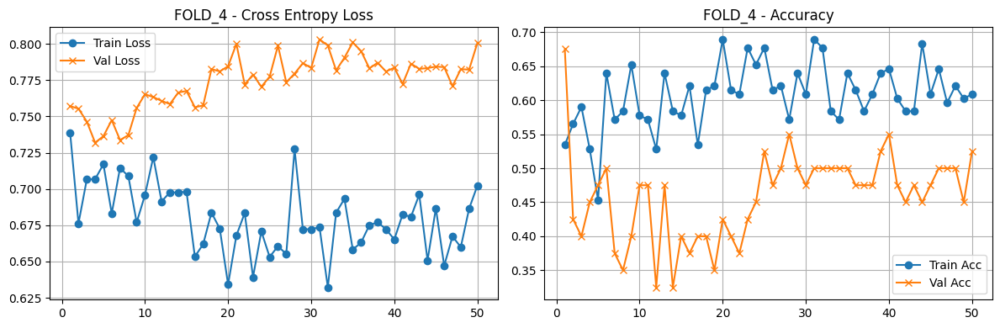

✅ FOLD_4 COMPLETE!


In [ ]:
train_bv_only_fold_no_early("Fold_4")


==================== STARTING BV FOLD_5 ====================


Epoch 01/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 01/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [01/50] | Train Loss: 0.7194 Acc: 0.6025 | Val Loss: 0.7212 Acc: 0.5000
   🌟 Val Loss improved to 0.7212. Model saved.


Epoch 02/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 02/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [02/50] | Train Loss: 0.7178 Acc: 0.4658 | Val Loss: 0.7555 Acc: 0.5000


Epoch 03/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 03/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [03/50] | Train Loss: 0.7097 Acc: 0.5839 | Val Loss: 0.7508 Acc: 0.4500


Epoch 04/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 04/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [04/50] | Train Loss: 0.6928 Acc: 0.5528 | Val Loss: 0.7693 Acc: 0.4500


Epoch 05/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 05/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [05/50] | Train Loss: 0.6701 Acc: 0.6770 | Val Loss: 0.7779 Acc: 0.5500


Epoch 06/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 06/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [06/50] | Train Loss: 0.6684 Acc: 0.5714 | Val Loss: 0.7586 Acc: 0.4750


Epoch 07/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 07/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [07/50] | Train Loss: 0.6825 Acc: 0.6522 | Val Loss: 0.7680 Acc: 0.4250


Epoch 08/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 08/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [08/50] | Train Loss: 0.6858 Acc: 0.5963 | Val Loss: 0.7994 Acc: 0.5250


Epoch 09/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 09/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [09/50] | Train Loss: 0.6630 Acc: 0.6957 | Val Loss: 0.8102 Acc: 0.5250


Epoch 10/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 10/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [10/50] | Train Loss: 0.6953 Acc: 0.6211 | Val Loss: 0.7762 Acc: 0.5000


Epoch 11/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 11/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [11/50] | Train Loss: 0.6903 Acc: 0.6211 | Val Loss: 0.7924 Acc: 0.5500


Epoch 12/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 12/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [12/50] | Train Loss: 0.6732 Acc: 0.5528 | Val Loss: 0.7970 Acc: 0.4750


Epoch 13/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 13/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [13/50] | Train Loss: 0.6779 Acc: 0.6398 | Val Loss: 0.8339 Acc: 0.5250


Epoch 14/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 14/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [14/50] | Train Loss: 0.6831 Acc: 0.5839 | Val Loss: 0.8298 Acc: 0.5750


Epoch 15/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 15/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [15/50] | Train Loss: 0.7235 Acc: 0.5466 | Val Loss: 0.8144 Acc: 0.5250


Epoch 16/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 16/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [16/50] | Train Loss: 0.6980 Acc: 0.5776 | Val Loss: 0.8236 Acc: 0.5500


Epoch 17/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 17/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [17/50] | Train Loss: 0.7005 Acc: 0.6646 | Val Loss: 0.8223 Acc: 0.5250


Epoch 18/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 18/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [18/50] | Train Loss: 0.6357 Acc: 0.7019 | Val Loss: 0.7961 Acc: 0.5000


Epoch 19/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 19/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [19/50] | Train Loss: 0.7414 Acc: 0.4969 | Val Loss: 0.7883 Acc: 0.4000


Epoch 20/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 20/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [20/50] | Train Loss: 0.7084 Acc: 0.6211 | Val Loss: 0.8226 Acc: 0.6000


Epoch 21/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 21/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [21/50] | Train Loss: 0.6294 Acc: 0.7329 | Val Loss: 0.7951 Acc: 0.4750


Epoch 22/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 22/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [22/50] | Train Loss: 0.6599 Acc: 0.5963 | Val Loss: 0.8091 Acc: 0.3750


Epoch 23/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 23/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [23/50] | Train Loss: 0.6694 Acc: 0.6211 | Val Loss: 0.8153 Acc: 0.4500


Epoch 24/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 24/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [24/50] | Train Loss: 0.7089 Acc: 0.6211 | Val Loss: 0.8369 Acc: 0.5250


Epoch 25/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 25/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [25/50] | Train Loss: 0.6486 Acc: 0.6957 | Val Loss: 0.8147 Acc: 0.4750


Epoch 26/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 26/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [26/50] | Train Loss: 0.6782 Acc: 0.6025 | Val Loss: 0.8294 Acc: 0.5250


Epoch 27/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 27/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [27/50] | Train Loss: 0.6440 Acc: 0.6025 | Val Loss: 0.8144 Acc: 0.4000


Epoch 28/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 28/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [28/50] | Train Loss: 0.6975 Acc: 0.5963 | Val Loss: 0.8218 Acc: 0.3750


Epoch 29/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 29/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [29/50] | Train Loss: 0.6749 Acc: 0.6398 | Val Loss: 0.8368 Acc: 0.3750


Epoch 30/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 30/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [30/50] | Train Loss: 0.6683 Acc: 0.6025 | Val Loss: 0.8230 Acc: 0.4250


Epoch 31/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 31/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [31/50] | Train Loss: 0.6710 Acc: 0.6335 | Val Loss: 0.8350 Acc: 0.4500


Epoch 32/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 32/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [32/50] | Train Loss: 0.6553 Acc: 0.7081 | Val Loss: 0.8300 Acc: 0.4000


Epoch 33/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 33/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [33/50] | Train Loss: 0.6406 Acc: 0.6335 | Val Loss: 0.8199 Acc: 0.4250


Epoch 34/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 34/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [34/50] | Train Loss: 0.6506 Acc: 0.6335 | Val Loss: 0.8220 Acc: 0.4000


Epoch 35/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 35/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [35/50] | Train Loss: 0.6380 Acc: 0.6708 | Val Loss: 0.8493 Acc: 0.4250


Epoch 36/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 36/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [36/50] | Train Loss: 0.7129 Acc: 0.5839 | Val Loss: 0.8284 Acc: 0.4500


Epoch 37/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 37/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [37/50] | Train Loss: 0.6775 Acc: 0.6770 | Val Loss: 0.8283 Acc: 0.4000


Epoch 38/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 38/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [38/50] | Train Loss: 0.6380 Acc: 0.7019 | Val Loss: 0.8293 Acc: 0.4000


Epoch 39/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 39/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [39/50] | Train Loss: 0.6585 Acc: 0.6273 | Val Loss: 0.8288 Acc: 0.4750


Epoch 40/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 40/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [40/50] | Train Loss: 0.6649 Acc: 0.6398 | Val Loss: 0.8267 Acc: 0.4500


Epoch 41/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 41/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [41/50] | Train Loss: 0.6158 Acc: 0.6957 | Val Loss: 0.8275 Acc: 0.4000


Epoch 42/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 42/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [42/50] | Train Loss: 0.6599 Acc: 0.6957 | Val Loss: 0.8251 Acc: 0.4750


Epoch 43/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 43/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [43/50] | Train Loss: 0.7460 Acc: 0.5839 | Val Loss: 0.8283 Acc: 0.4500


Epoch 44/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 44/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [44/50] | Train Loss: 0.6784 Acc: 0.6025 | Val Loss: 0.8351 Acc: 0.4250


Epoch 45/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 45/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [45/50] | Train Loss: 0.6384 Acc: 0.6646 | Val Loss: 0.8201 Acc: 0.4500


Epoch 46/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 46/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [46/50] | Train Loss: 0.6579 Acc: 0.6894 | Val Loss: 0.8247 Acc: 0.4250


Epoch 47/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 47/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [47/50] | Train Loss: 0.6674 Acc: 0.6335 | Val Loss: 0.8178 Acc: 0.4250


Epoch 48/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 48/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [48/50] | Train Loss: 0.7080 Acc: 0.5652 | Val Loss: 0.8289 Acc: 0.4000


Epoch 49/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 49/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [49/50] | Train Loss: 0.6762 Acc: 0.6522 | Val Loss: 0.8090 Acc: 0.4250


Epoch 50/50 [Train]:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 50/50 [Val BV]:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch [50/50] | Train Loss: 0.6394 Acc: 0.6832 | Val Loss: 0.8174 Acc: 0.4500


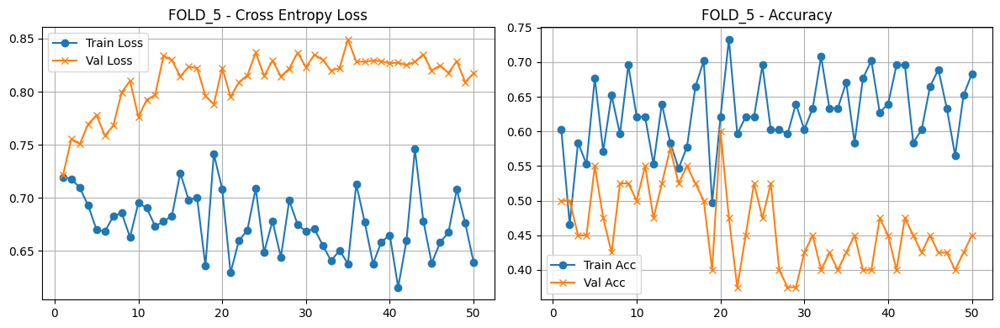

✅ FOLD_5 COMPLETE!


In [ ]:
train_bv_only_fold_no_early("Fold_5")